<a href="https://colab.research.google.com/github/ZahraBehzad/learn-CNN/blob/main/ycbcr.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

cell code: 11

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
23/23 - 9s - 394ms/step - loss: 2358.6108
Epoch 2/100
23/23 - 1s - 30ms/step - loss: 376.9588
Epoch 3/100
23/23 - 1s - 30ms/step - loss: 283.2166
Epoch 4/100
23/23 - 1s - 30ms/step - loss: 204.6929
Epoch 5/100
23/23 - 1s - 55ms/step - loss: 148.6143
Epoch 6/100
23/23 - 1s - 30ms/step - loss: 110.5251
Epoch 7/100
23/23 - 1s - 31ms/step - loss: 90.4023
Epoch 8/100
23/23 - 1s - 55ms/step - loss: 79.4806
Epoch 9/100
23/23 - 1s - 54ms/step - loss: 71.6621
Epoch 10/100
23/23 - 1s - 30ms/step - loss: 65.2072
Epoch 11/100
23/23 - 1s - 30ms/step - loss: 61.2585
Epoch 12/100
23/23 - 1s - 30ms/step - loss: 58.2586
Epoch 13/100
23/23 - 1s - 30ms/step - loss: 56.4735
Epoch 14/100
23/23 - 1s - 55ms/step - loss: 53.3956
Epoch 15/100
23/23 - 1s - 31ms/step - loss: 51.4577
Epoch 16/100
23/23 - 1s - 55ms/step - loss: 49.4030
Epoch 17/100
23/23 - 1s - 31ms/step - loss: 46.6137
Epoch 18/100
23/23 - 1s - 57ms/step - loss: 44.0340
Epoch 19/100
23/23 - 1s - 36ms/step - loss: 42.0405
Epoch 20/100


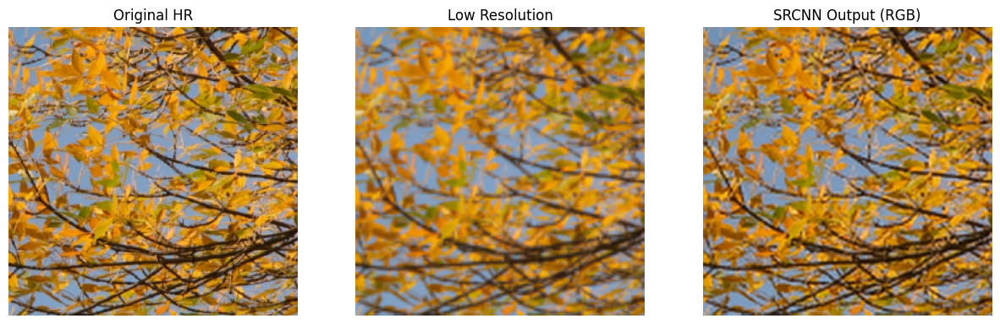

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, transform
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import tensorflow as tf
from tensorflow.keras import layers, models
from glob import glob

# تعریف آماده‌سازی تصویر Low-Resolution
def prepare_lr(img, scale=2):
    img = color.rgb2ycbcr(img)[:, :, 0]
    img = transform.resize(img, (img.shape[0]//scale, img.shape[1]//scale), anti_aliasing=True)
    img = transform.resize(img, (img.shape[0]*scale, img.shape[1]*scale), anti_aliasing=True)
    return img

# بارگذاری همه تصاویر
def load_images(path):
    files = glob(os.path.join(path, '*.bmp')) + glob(os.path.join(path, '*.png')) + glob(os.path.join(path, '*.jpg'))
    images = []
    for file in files:
        img = io.imread(file)
        img = transform.resize(img, (256, 256), anti_aliasing=True)
        images.append(img)
    return images

dataset_path = '/content/drive/MyDrive/basicCNN/91images/'  # مسیر دیتاست
images = load_images(dataset_path)

# آماده‌سازی داده‌ها
x_train = []
y_train = []

for img in images:
    lr = prepare_lr(img)
    hr = color.rgb2ycbcr(img)[:, :, 0]
    x_train.append(lr)
    y_train.append(hr)

x_train = np.expand_dims(np.array(x_train), -1)
y_train = np.expand_dims(np.array(y_train), -1)

# ساخت مدل SRCNN
model = models.Sequential([
    layers.Conv2D(64, (9,9), activation='relu', padding='same', input_shape=(None, None, 1)),
    layers.Conv2D(32, (5,5), activation='relu', padding='same'),
    layers.Conv2D(1, (5,5), activation='linear', padding='same')
])

model.compile(optimizer='adam', loss='mse')

# آموزش مدل
model.fit(x_train, y_train, batch_size=4, epochs=100, verbose=2)

# تست روی یک تصویر
idx = np.random.randint(0, len(images))
original_img = transform.resize(images[idx], (256, 256), anti_aliasing=True)
img_ycbcr = color.rgb2ycbcr(original_img)
lr_img = prepare_lr(original_img)

# مدل روی Y کانال کار می‌کند
test_lr = np.expand_dims(lr_img, axis=(0, -1))
predicted_y = model.predict(test_lr)[0, ..., 0]

# بازیابی کانال‌های Cb و Cr و بازسازی تصویر رنگی
cb = transform.resize(img_ycbcr[:, :, 1], predicted_y.shape, anti_aliasing=True)
cr = transform.resize(img_ycbcr[:, :, 2], predicted_y.shape, anti_aliasing=True)
output_ycbcr = np.stack((predicted_y, cb, cr), axis=-1)
output_rgb = np.clip(color.ycbcr2rgb(output_ycbcr), 0, 1)

# محاسبه ارزیابی روی کانال Y
test_hr = img_ycbcr[:, :, 0]
print("PSNR (Y channel):", psnr(test_hr, predicted_y, data_range=1.0))
print("SSIM (Y channel):", ssim(test_hr, predicted_y, data_range=1.0))

# نمایش نتایج
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.title('Original HR')
plt.imshow(original_img)
plt.axis('off')

plt.subplot(1,3,2)
plt.title('Low Resolution')
lr_show = color.ycbcr2rgb(np.stack((lr_img, cb, cr), axis=-1))
plt.imshow(np.clip(lr_show, 0, 1))
plt.axis('off')

plt.subplot(1,3,3)
plt.title('SRCNN Output (RGB)')
plt.imshow(output_rgb)
plt.axis('off')

plt.show()

cell code: 12

Epoch 1/200


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 - 3s - 148ms/step - loss: 2290.4153
Epoch 2/200
23/23 - 1s - 43ms/step - loss: 473.2490
Epoch 3/200
23/23 - 1s - 55ms/step - loss: 283.5822
Epoch 4/200
23/23 - 1s - 32ms/step - loss: 169.3500
Epoch 5/200
23/23 - 1s - 32ms/step - loss: 122.8197
Epoch 6/200
23/23 - 1s - 32ms/step - loss: 99.7702
Epoch 7/200
23/23 - 1s - 55ms/step - loss: 83.4074
Epoch 8/200
23/23 - 1s - 55ms/step - loss: 70.0962
Epoch 9/200
23/23 - 1s - 32ms/step - loss: 61.3076
Epoch 10/200
23/23 - 1s - 55ms/step - loss: 55.4939
Epoch 11/200
23/23 - 1s - 33ms/step - loss: 52.1709
Epoch 12/200
23/23 - 1s - 33ms/step - loss: 49.6656
Epoch 13/200
23/23 - 1s - 33ms/step - loss: 46.6774
Epoch 14/200
23/23 - 1s - 33ms/step - loss: 46.6939
Epoch 15/200
23/23 - 1s - 54ms/step - loss: 44.3743
Epoch 16/200
23/23 - 1s - 35ms/step - loss: 40.7134
Epoch 17/200
23/23 - 1s - 53ms/step - loss: 40.3225
Epoch 18/200
23/23 - 1s - 55ms/step - loss: 37.4633
Epoch 19/200
23/23 - 1s - 55ms/step - loss: 35.8242
Epoch 20/200
23/23 - 1s - 

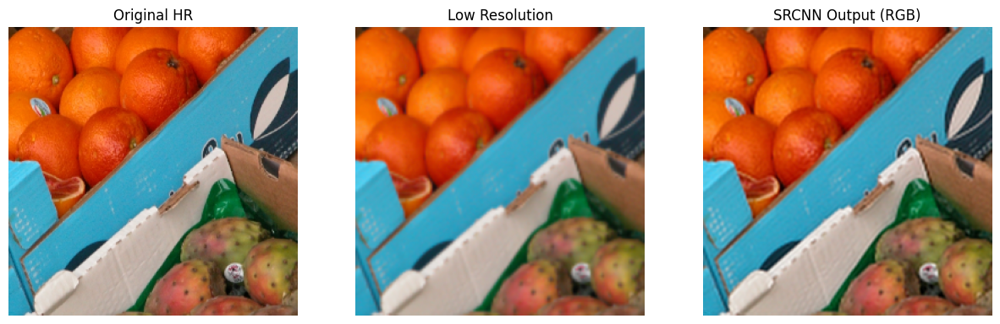

In [3]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, transform
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import tensorflow as tf
from tensorflow.keras import layers, models
from glob import glob

# تعریف آماده‌سازی تصویر Low-Resolution
def prepare_lr(img, scale=2):
    img = color.rgb2ycbcr(img)[:, :, 0]
    img = transform.resize(img, (img.shape[0]//scale, img.shape[1]//scale), anti_aliasing=True)
    img = transform.resize(img, (img.shape[0]*scale, img.shape[1]*scale), anti_aliasing=True)
    return img

# بارگذاری همه تصاویر
def load_images(path):
    files = glob(os.path.join(path, '*.bmp')) + glob(os.path.join(path, '*.png')) + glob(os.path.join(path, '*.jpg'))
    images = []
    for file in files:
        img = io.imread(file)
        img = transform.resize(img, (256, 256), anti_aliasing=True)
        images.append(img)
    return images

dataset_path = '/content/drive/MyDrive/basicCNN/91images/'  # مسیر دیتاست
images = load_images(dataset_path)

# آماده‌سازی داده‌ها
x_train = []
y_train = []

for img in images:
    lr = prepare_lr(img)
    hr = color.rgb2ycbcr(img)[:, :, 0]
    x_train.append(lr)
    y_train.append(hr)

x_train = np.expand_dims(np.array(x_train), -1)
y_train = np.expand_dims(np.array(y_train), -1)

# ساخت مدل SRCNN
model = models.Sequential([
    layers.Conv2D(64, (9,9), activation='relu', padding='same', input_shape=(None, None, 1)),
    layers.Conv2D(32, (5,5), activation='relu', padding='same'),
    layers.Conv2D(1, (5,5), activation='linear', padding='same')
])

model.compile(optimizer='adam', loss='mse')

# آموزش مدل
model.fit(x_train, y_train, batch_size=4, epochs=200, verbose=2)

# تست روی یک تصویر
idx = np.random.randint(0, len(images))
original_img = transform.resize(images[idx], (256, 256), anti_aliasing=True)
img_ycbcr = color.rgb2ycbcr(original_img)
lr_img = prepare_lr(original_img)

# مدل روی Y کانال کار می‌کند
test_lr = np.expand_dims(lr_img, axis=(0, -1))
predicted_y = model.predict(test_lr)[0, ..., 0]

# بازیابی کانال‌های Cb و Cr و بازسازی تصویر رنگی
cb = transform.resize(img_ycbcr[:, :, 1], predicted_y.shape, anti_aliasing=True)
cr = transform.resize(img_ycbcr[:, :, 2], predicted_y.shape, anti_aliasing=True)
output_ycbcr = np.stack((predicted_y, cb, cr), axis=-1)
output_rgb = np.clip(color.ycbcr2rgb(output_ycbcr), 0, 1)

# محاسبه ارزیابی روی کانال Y
test_hr = img_ycbcr[:, :, 0]
print("PSNR (Y channel):", psnr(test_hr, predicted_y, data_range=1.0))
print("SSIM (Y channel):", ssim(test_hr, predicted_y, data_range=1.0))

# نمایش نتایج
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.title('Original HR')
plt.imshow(original_img)
plt.axis('off')

plt.subplot(1,3,2)
plt.title('Low Resolution')
lr_show = color.ycbcr2rgb(np.stack((lr_img, cb, cr), axis=-1))
plt.imshow(np.clip(lr_show, 0, 1))
plt.axis('off')

plt.subplot(1,3,3)
plt.title('SRCNN Output (RGB)')
plt.imshow(output_rgb)
plt.axis('off')

plt.show()

cell code: 13

Epoch 1/300


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 - 3s - 130ms/step - loss: 2814.2339
Epoch 2/300
23/23 - 1s - 59ms/step - loss: 338.7892
Epoch 3/300
23/23 - 1s - 55ms/step - loss: 225.0486
Epoch 4/300
23/23 - 1s - 55ms/step - loss: 190.2823
Epoch 5/300
23/23 - 1s - 55ms/step - loss: 136.2578
Epoch 6/300
23/23 - 1s - 32ms/step - loss: 119.9674
Epoch 7/300
23/23 - 1s - 31ms/step - loss: 111.6849
Epoch 8/300
23/23 - 1s - 31ms/step - loss: 138.1435
Epoch 9/300
23/23 - 1s - 55ms/step - loss: 101.9344
Epoch 10/300
23/23 - 1s - 55ms/step - loss: 74.9194
Epoch 11/300
23/23 - 1s - 55ms/step - loss: 66.9208
Epoch 12/300
23/23 - 1s - 55ms/step - loss: 62.2673
Epoch 13/300
23/23 - 1s - 55ms/step - loss: 58.7351
Epoch 14/300
23/23 - 1s - 32ms/step - loss: 55.9866
Epoch 15/300
23/23 - 1s - 55ms/step - loss: 53.4953
Epoch 16/300
23/23 - 1s - 55ms/step - loss: 51.6374
Epoch 17/300
23/23 - 1s - 55ms/step - loss: 50.0305
Epoch 18/300
23/23 - 1s - 32ms/step - loss: 48.4411
Epoch 19/300
23/23 - 1s - 32ms/step - loss: 46.9282
Epoch 20/300
23/23 - 1

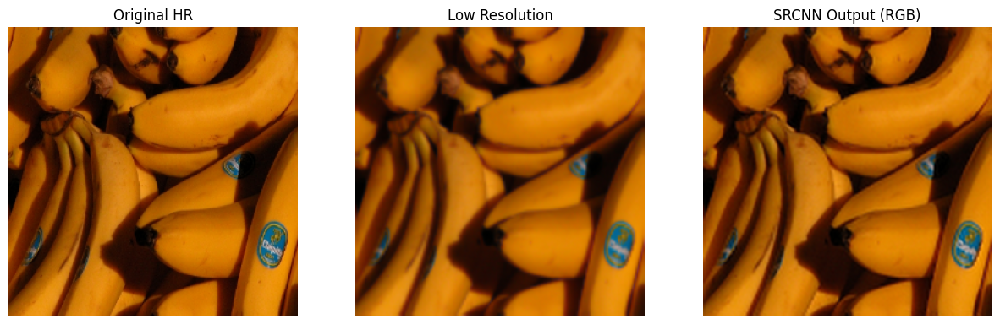

In [4]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, transform
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import tensorflow as tf
from tensorflow.keras import layers, models
from glob import glob

# تعریف آماده‌سازی تصویر Low-Resolution
def prepare_lr(img, scale=2):
    img = color.rgb2ycbcr(img)[:, :, 0]
    img = transform.resize(img, (img.shape[0]//scale, img.shape[1]//scale), anti_aliasing=True)
    img = transform.resize(img, (img.shape[0]*scale, img.shape[1]*scale), anti_aliasing=True)
    return img

# بارگذاری همه تصاویر
def load_images(path):
    files = glob(os.path.join(path, '*.bmp')) + glob(os.path.join(path, '*.png')) + glob(os.path.join(path, '*.jpg'))
    images = []
    for file in files:
        img = io.imread(file)
        img = transform.resize(img, (256, 256), anti_aliasing=True)
        images.append(img)
    return images

dataset_path = '/content/drive/MyDrive/basicCNN/91images/'  # مسیر دیتاست
images = load_images(dataset_path)

# آماده‌سازی داده‌ها
x_train = []
y_train = []

for img in images:
    lr = prepare_lr(img)
    hr = color.rgb2ycbcr(img)[:, :, 0]
    x_train.append(lr)
    y_train.append(hr)

x_train = np.expand_dims(np.array(x_train), -1)
y_train = np.expand_dims(np.array(y_train), -1)

# ساخت مدل SRCNN
model = models.Sequential([
    layers.Conv2D(64, (9,9), activation='relu', padding='same', input_shape=(None, None, 1)),
    layers.Conv2D(32, (5,5), activation='relu', padding='same'),
    layers.Conv2D(1, (5,5), activation='linear', padding='same')
])

model.compile(optimizer='adam', loss='mse')

# آموزش مدل
model.fit(x_train, y_train, batch_size=4, epochs=300, verbose=2)

# تست روی یک تصویر
idx = np.random.randint(0, len(images))
original_img = transform.resize(images[idx], (256, 256), anti_aliasing=True)
img_ycbcr = color.rgb2ycbcr(original_img)
lr_img = prepare_lr(original_img)

# مدل روی Y کانال کار می‌کند
test_lr = np.expand_dims(lr_img, axis=(0, -1))
predicted_y = model.predict(test_lr)[0, ..., 0]

# بازیابی کانال‌های Cb و Cr و بازسازی تصویر رنگی
cb = transform.resize(img_ycbcr[:, :, 1], predicted_y.shape, anti_aliasing=True)
cr = transform.resize(img_ycbcr[:, :, 2], predicted_y.shape, anti_aliasing=True)
output_ycbcr = np.stack((predicted_y, cb, cr), axis=-1)
output_rgb = np.clip(color.ycbcr2rgb(output_ycbcr), 0, 1)

# محاسبه ارزیابی روی کانال Y
test_hr = img_ycbcr[:, :, 0]
print("PSNR (Y channel):", psnr(test_hr, predicted_y, data_range=1.0))
print("SSIM (Y channel):", ssim(test_hr, predicted_y, data_range=1.0))

# نمایش نتایج
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.title('Original HR')
plt.imshow(original_img)
plt.axis('off')

plt.subplot(1,3,2)
plt.title('Low Resolution')
lr_show = color.ycbcr2rgb(np.stack((lr_img, cb, cr), axis=-1))
plt.imshow(np.clip(lr_show, 0, 1))
plt.axis('off')

plt.subplot(1,3,3)
plt.title('SRCNN Output (RGB)')
plt.imshow(output_rgb)
plt.axis('off')

plt.show()

cell code: 14

Epoch 1/400


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 - 3s - 119ms/step - loss: 1423.2094
Epoch 2/400
23/23 - 1s - 35ms/step - loss: 252.4206
Epoch 3/400
23/23 - 1s - 54ms/step - loss: 134.5550
Epoch 4/400
23/23 - 1s - 58ms/step - loss: 80.4991
Epoch 5/400
23/23 - 1s - 36ms/step - loss: 62.0721
Epoch 6/400
23/23 - 1s - 55ms/step - loss: 53.5431
Epoch 7/400
23/23 - 1s - 52ms/step - loss: 48.6652
Epoch 8/400
23/23 - 1s - 36ms/step - loss: 45.0274
Epoch 9/400
23/23 - 1s - 35ms/step - loss: 43.1113
Epoch 10/400
23/23 - 1s - 54ms/step - loss: 98.5823
Epoch 11/400
23/23 - 1s - 54ms/step - loss: 56.8252
Epoch 12/400
23/23 - 1s - 32ms/step - loss: 42.6766
Epoch 13/400
23/23 - 1s - 32ms/step - loss: 38.0812
Epoch 14/400
23/23 - 1s - 54ms/step - loss: 36.8390
Epoch 15/400
23/23 - 1s - 55ms/step - loss: 35.8134
Epoch 16/400
23/23 - 1s - 32ms/step - loss: 34.8499
Epoch 17/400
23/23 - 1s - 33ms/step - loss: 34.2200
Epoch 18/400
23/23 - 1s - 55ms/step - loss: 33.6395
Epoch 19/400
23/23 - 1s - 54ms/step - loss: 32.8521
Epoch 20/400
23/23 - 1s - 55

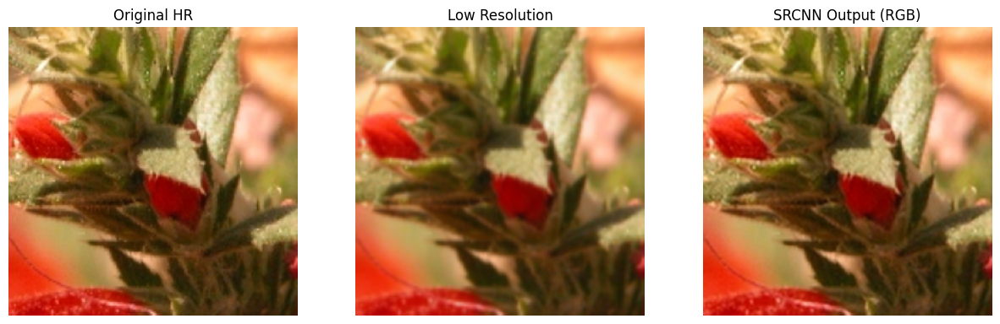

In [5]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, transform
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import tensorflow as tf
from tensorflow.keras import layers, models
from glob import glob

# تعریف آماده‌سازی تصویر Low-Resolution
def prepare_lr(img, scale=2):
    img = color.rgb2ycbcr(img)[:, :, 0]
    img = transform.resize(img, (img.shape[0]//scale, img.shape[1]//scale), anti_aliasing=True)
    img = transform.resize(img, (img.shape[0]*scale, img.shape[1]*scale), anti_aliasing=True)
    return img

# بارگذاری همه تصاویر
def load_images(path):
    files = glob(os.path.join(path, '*.bmp')) + glob(os.path.join(path, '*.png')) + glob(os.path.join(path, '*.jpg'))
    images = []
    for file in files:
        img = io.imread(file)
        img = transform.resize(img, (256, 256), anti_aliasing=True)
        images.append(img)
    return images

dataset_path = '/content/drive/MyDrive/basicCNN/91images/'  # مسیر دیتاست
images = load_images(dataset_path)

# آماده‌سازی داده‌ها
x_train = []
y_train = []

for img in images:
    lr = prepare_lr(img)
    hr = color.rgb2ycbcr(img)[:, :, 0]
    x_train.append(lr)
    y_train.append(hr)

x_train = np.expand_dims(np.array(x_train), -1)
y_train = np.expand_dims(np.array(y_train), -1)

# ساخت مدل SRCNN
model = models.Sequential([
    layers.Conv2D(64, (9,9), activation='relu', padding='same', input_shape=(None, None, 1)),
    layers.Conv2D(32, (5,5), activation='relu', padding='same'),
    layers.Conv2D(1, (5,5), activation='linear', padding='same')
])

model.compile(optimizer='adam', loss='mse')

# آموزش مدل
model.fit(x_train, y_train, batch_size=4, epochs=400, verbose=2)

# تست روی یک تصویر
idx = np.random.randint(0, len(images))
original_img = transform.resize(images[idx], (256, 256), anti_aliasing=True)
img_ycbcr = color.rgb2ycbcr(original_img)
lr_img = prepare_lr(original_img)

# مدل روی Y کانال کار می‌کند
test_lr = np.expand_dims(lr_img, axis=(0, -1))
predicted_y = model.predict(test_lr)[0, ..., 0]

# بازیابی کانال‌های Cb و Cr و بازسازی تصویر رنگی
cb = transform.resize(img_ycbcr[:, :, 1], predicted_y.shape, anti_aliasing=True)
cr = transform.resize(img_ycbcr[:, :, 2], predicted_y.shape, anti_aliasing=True)
output_ycbcr = np.stack((predicted_y, cb, cr), axis=-1)
output_rgb = np.clip(color.ycbcr2rgb(output_ycbcr), 0, 1)

# محاسبه ارزیابی روی کانال Y
test_hr = img_ycbcr[:, :, 0]
print("PSNR (Y channel):", psnr(test_hr, predicted_y, data_range=1.0))
print("SSIM (Y channel):", ssim(test_hr, predicted_y, data_range=1.0))

# نمایش نتایج
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.title('Original HR')
plt.imshow(original_img)
plt.axis('off')

plt.subplot(1,3,2)
plt.title('Low Resolution')
lr_show = color.ycbcr2rgb(np.stack((lr_img, cb, cr), axis=-1))
plt.imshow(np.clip(lr_show, 0, 1))
plt.axis('off')

plt.subplot(1,3,3)
plt.title('SRCNN Output (RGB)')
plt.imshow(output_rgb)
plt.axis('off')

plt.show()

cell code: 15

Epoch 1/500


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 - 3s - 131ms/step - loss: 3896.7603
Epoch 2/500
23/23 - 1s - 33ms/step - loss: 534.6246
Epoch 3/500
23/23 - 1s - 54ms/step - loss: 391.5789
Epoch 4/500
23/23 - 1s - 32ms/step - loss: 247.2505
Epoch 5/500
23/23 - 1s - 54ms/step - loss: 169.1820
Epoch 6/500
23/23 - 1s - 55ms/step - loss: 157.4089
Epoch 7/500
23/23 - 1s - 55ms/step - loss: 107.5397
Epoch 8/500
23/23 - 1s - 32ms/step - loss: 95.3693
Epoch 9/500
23/23 - 1s - 32ms/step - loss: 83.8715
Epoch 10/500
23/23 - 1s - 32ms/step - loss: 75.6601
Epoch 11/500
23/23 - 1s - 32ms/step - loss: 69.7180
Epoch 12/500
23/23 - 1s - 32ms/step - loss: 64.4178
Epoch 13/500
23/23 - 1s - 32ms/step - loss: 60.5161
Epoch 14/500
23/23 - 1s - 55ms/step - loss: 56.7551
Epoch 15/500
23/23 - 1s - 33ms/step - loss: 56.0384
Epoch 16/500
23/23 - 1s - 55ms/step - loss: 57.2630
Epoch 17/500
23/23 - 1s - 54ms/step - loss: 50.4788
Epoch 18/500
23/23 - 1s - 33ms/step - loss: 47.8515
Epoch 19/500
23/23 - 1s - 55ms/step - loss: 46.2991
Epoch 20/500
23/23 - 1s 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
PSNR (Y channel): -8.978104760749229
SSIM (Y channel): 0.9365530388495181


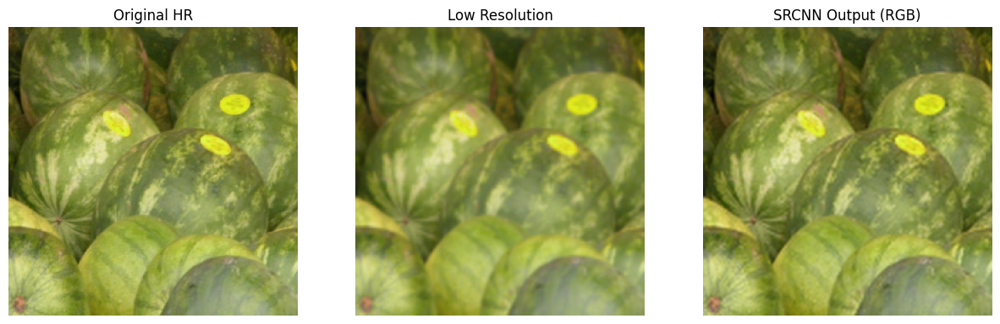

In [7]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, transform
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import tensorflow as tf
from tensorflow.keras import layers, models
from glob import glob

# تعریف آماده‌سازی تصویر Low-Resolution
def prepare_lr(img, scale=2):
    img = color.rgb2ycbcr(img)[:, :, 0]
    img = transform.resize(img, (img.shape[0]//scale, img.shape[1]//scale), anti_aliasing=True)
    img = transform.resize(img, (img.shape[0]*scale, img.shape[1]*scale), anti_aliasing=True)
    return img

# بارگذاری همه تصاویر
def load_images(path):
    files = glob(os.path.join(path, '*.bmp')) + glob(os.path.join(path, '*.png')) + glob(os.path.join(path, '*.jpg'))
    images = []
    for file in files:
        img = io.imread(file)
        img = transform.resize(img, (256, 256), anti_aliasing=True)
        images.append(img)
    return images

dataset_path = '/content/drive/MyDrive/basicCNN/91images/'  # مسیر دیتاست
images = load_images(dataset_path)

# آماده‌سازی داده‌ها
x_train = []
y_train = []

for img in images:
    lr = prepare_lr(img)
    hr = color.rgb2ycbcr(img)[:, :, 0]
    x_train.append(lr)
    y_train.append(hr)

x_train = np.expand_dims(np.array(x_train), -1)
y_train = np.expand_dims(np.array(y_train), -1)

# ساخت مدل SRCNN
model = models.Sequential([
    layers.Conv2D(64, (9,9), activation='relu', padding='same', input_shape=(None, None, 1)),
    layers.Conv2D(32, (5,5), activation='relu', padding='same'),
    layers.Conv2D(1, (5,5), activation='linear', padding='same')
])

model.compile(optimizer='adam', loss='mse')

# آموزش مدل
model.fit(x_train, y_train, batch_size=4, epochs=500, verbose=2)

# تست روی یک تصویر
idx = np.random.randint(0, len(images))
original_img = transform.resize(images[idx], (256, 256), anti_aliasing=True)
img_ycbcr = color.rgb2ycbcr(original_img)
lr_img = prepare_lr(original_img)

# مدل روی Y کانال کار می‌کند
test_lr = np.expand_dims(lr_img, axis=(0, -1))
predicted_y = model.predict(test_lr)[0, ..., 0]

# بازیابی کانال‌های Cb و Cr و بازسازی تصویر رنگی
cb = transform.resize(img_ycbcr[:, :, 1], predicted_y.shape, anti_aliasing=True)
cr = transform.resize(img_ycbcr[:, :, 2], predicted_y.shape, anti_aliasing=True)
output_ycbcr = np.stack((predicted_y, cb, cr), axis=-1)
output_rgb = np.clip(color.ycbcr2rgb(output_ycbcr), 0, 1)

# محاسبه ارزیابی روی کانال Y
test_hr = img_ycbcr[:, :, 0]
print("PSNR (Y channel):", psnr(test_hr, predicted_y, data_range=1.0))
print("SSIM (Y channel):", ssim(test_hr, predicted_y, data_range=1.0))

# نمایش نتایج
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.title('Original HR')
plt.imshow(original_img)
plt.axis('off')

plt.subplot(1,3,2)
plt.title('Low Resolution')
lr_show = color.ycbcr2rgb(np.stack((lr_img, cb, cr), axis=-1))
plt.imshow(np.clip(lr_show, 0, 1))
plt.axis('off')

plt.subplot(1,3,3)
plt.title('SRCNN Output (RGB)')
plt.imshow(output_rgb)
plt.axis('off')

plt.show()

cell code: 16

Epoch 1/600


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 - 3s - 118ms/step - loss: 2466.3711
Epoch 2/600
23/23 - 1s - 31ms/step - loss: 433.6248
Epoch 3/600
23/23 - 1s - 55ms/step - loss: 329.2273
Epoch 4/600
23/23 - 1s - 32ms/step - loss: 244.9796
Epoch 5/600
23/23 - 1s - 32ms/step - loss: 173.9480
Epoch 6/600
23/23 - 1s - 55ms/step - loss: 160.8459
Epoch 7/600
23/23 - 1s - 54ms/step - loss: 125.7945
Epoch 8/600
23/23 - 1s - 32ms/step - loss: 103.2147
Epoch 9/600
23/23 - 1s - 54ms/step - loss: 91.8626
Epoch 10/600
23/23 - 1s - 55ms/step - loss: 78.2033
Epoch 11/600
23/23 - 1s - 32ms/step - loss: 70.5763
Epoch 12/600
23/23 - 1s - 54ms/step - loss: 66.3155
Epoch 13/600
23/23 - 1s - 32ms/step - loss: 63.8092
Epoch 14/600
23/23 - 1s - 54ms/step - loss: 57.6275
Epoch 15/600
23/23 - 1s - 33ms/step - loss: 55.7130
Epoch 16/600
23/23 - 1s - 36ms/step - loss: 54.1357
Epoch 17/600
23/23 - 1s - 53ms/step - loss: 62.3874
Epoch 18/600
23/23 - 1s - 54ms/step - loss: 90.2266
Epoch 19/600
23/23 - 1s - 32ms/step - loss: 69.3142
Epoch 20/600
23/23 - 1s

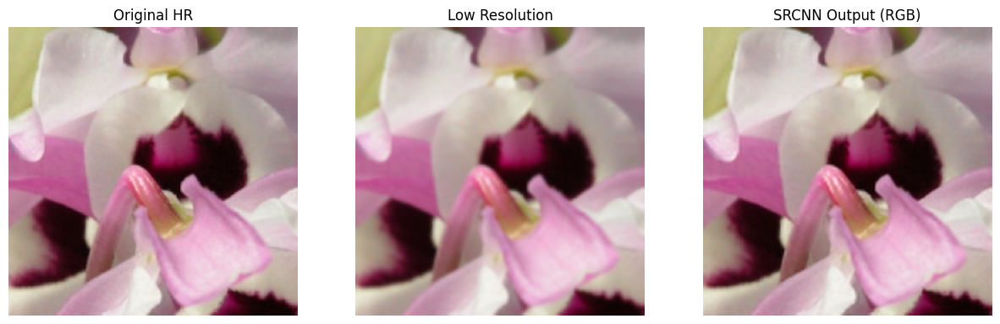

In [9]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, transform
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import tensorflow as tf
from tensorflow.keras import layers, models
from glob import glob

# تعریف آماده‌سازی تصویر Low-Resolution
def prepare_lr(img, scale=2):
    img = color.rgb2ycbcr(img)[:, :, 0]
    img = transform.resize(img, (img.shape[0]//scale, img.shape[1]//scale), anti_aliasing=True)
    img = transform.resize(img, (img.shape[0]*scale, img.shape[1]*scale), anti_aliasing=True)
    return img

# بارگذاری همه تصاویر
def load_images(path):
    files = glob(os.path.join(path, '*.bmp')) + glob(os.path.join(path, '*.png')) + glob(os.path.join(path, '*.jpg'))
    images = []
    for file in files:
        img = io.imread(file)
        img = transform.resize(img, (256, 256), anti_aliasing=True)
        images.append(img)
    return images

dataset_path = '/content/drive/MyDrive/basicCNN/91images/'  # مسیر دیتاست
images = load_images(dataset_path)

# آماده‌سازی داده‌ها
x_train = []
y_train = []

for img in images:
    lr = prepare_lr(img)
    hr = color.rgb2ycbcr(img)[:, :, 0]
    x_train.append(lr)
    y_train.append(hr)

x_train = np.expand_dims(np.array(x_train), -1)
y_train = np.expand_dims(np.array(y_train), -1)

# ساخت مدل SRCNN
model = models.Sequential([
    layers.Conv2D(64, (9,9), activation='relu', padding='same', input_shape=(None, None, 1)),
    layers.Conv2D(32, (5,5), activation='relu', padding='same'),
    layers.Conv2D(1, (5,5), activation='linear', padding='same')
])

model.compile(optimizer='adam', loss='mse')

# آموزش مدل
model.fit(x_train, y_train, batch_size=4, epochs=600, verbose=2)

# تست روی یک تصویر
idx = np.random.randint(0, len(images))
original_img = transform.resize(images[idx], (256, 256), anti_aliasing=True)
img_ycbcr = color.rgb2ycbcr(original_img)
lr_img = prepare_lr(original_img)

# مدل روی Y کانال کار می‌کند
test_lr = np.expand_dims(lr_img, axis=(0, -1))
predicted_y = model.predict(test_lr)[0, ..., 0]

# بازیابی کانال‌های Cb و Cr و بازسازی تصویر رنگی
cb = transform.resize(img_ycbcr[:, :, 1], predicted_y.shape, anti_aliasing=True)
cr = transform.resize(img_ycbcr[:, :, 2], predicted_y.shape, anti_aliasing=True)
output_ycbcr = np.stack((predicted_y, cb, cr), axis=-1)
output_rgb = np.clip(color.ycbcr2rgb(output_ycbcr), 0, 1)

# محاسبه ارزیابی روی کانال Y
test_hr = img_ycbcr[:, :, 0]
print("PSNR (Y channel):", psnr(test_hr, predicted_y, data_range=1.0))
print("SSIM (Y channel):", ssim(test_hr, predicted_y, data_range=1.0))

# نمایش نتایج
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.title('Original HR')
plt.imshow(original_img)
plt.axis('off')

plt.subplot(1,3,2)
plt.title('Low Resolution')
lr_show = color.ycbcr2rgb(np.stack((lr_img, cb, cr), axis=-1))
plt.imshow(np.clip(lr_show, 0, 1))
plt.axis('off')

plt.subplot(1,3,3)
plt.title('SRCNN Output (RGB)')
plt.imshow(output_rgb)
plt.axis('off')

plt.show()

cell code: 17

Epoch 1/700


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 - 3s - 116ms/step - loss: 1827.3137
Epoch 2/700
23/23 - 1s - 62ms/step - loss: 374.2029
Epoch 3/700
23/23 - 1s - 55ms/step - loss: 213.1586
Epoch 4/700
23/23 - 1s - 33ms/step - loss: 127.6596
Epoch 5/700
23/23 - 1s - 33ms/step - loss: 83.5254
Epoch 6/700
23/23 - 1s - 55ms/step - loss: 62.0091
Epoch 7/700
23/23 - 1s - 54ms/step - loss: 61.9820
Epoch 8/700
23/23 - 1s - 54ms/step - loss: 57.8822
Epoch 9/700
23/23 - 1s - 32ms/step - loss: 45.2532
Epoch 10/700
23/23 - 1s - 54ms/step - loss: 42.3511
Epoch 11/700
23/23 - 1s - 55ms/step - loss: 40.5644
Epoch 12/700
23/23 - 1s - 55ms/step - loss: 39.0081
Epoch 13/700
23/23 - 1s - 55ms/step - loss: 38.4641
Epoch 14/700
23/23 - 1s - 55ms/step - loss: 50.3823
Epoch 15/700
23/23 - 1s - 33ms/step - loss: 38.4827
Epoch 16/700
23/23 - 1s - 33ms/step - loss: 35.4804
Epoch 17/700
23/23 - 1s - 33ms/step - loss: 34.8773
Epoch 18/700
23/23 - 1s - 54ms/step - loss: 34.4765
Epoch 19/700
23/23 - 1s - 54ms/step - loss: 34.8064
Epoch 20/700
23/23 - 1s - 3

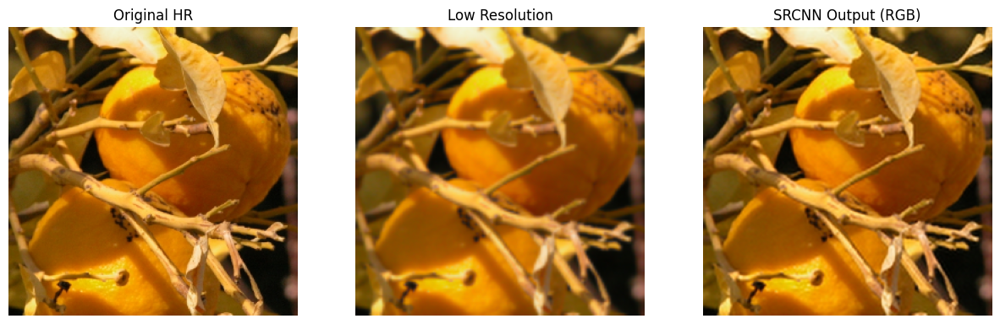

In [11]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, transform
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import tensorflow as tf
from tensorflow.keras import layers, models
from glob import glob

# تعریف آماده‌سازی تصویر Low-Resolution
def prepare_lr(img, scale=2):
    img = color.rgb2ycbcr(img)[:, :, 0]
    img = transform.resize(img, (img.shape[0]//scale, img.shape[1]//scale), anti_aliasing=True)
    img = transform.resize(img, (img.shape[0]*scale, img.shape[1]*scale), anti_aliasing=True)
    return img

# بارگذاری همه تصاویر
def load_images(path):
    files = glob(os.path.join(path, '*.bmp')) + glob(os.path.join(path, '*.png')) + glob(os.path.join(path, '*.jpg'))
    images = []
    for file in files:
        img = io.imread(file)
        img = transform.resize(img, (256, 256), anti_aliasing=True)
        images.append(img)
    return images

dataset_path = '/content/drive/MyDrive/basicCNN/91images/'  # مسیر دیتاست
images = load_images(dataset_path)

# آماده‌سازی داده‌ها
x_train = []
y_train = []

for img in images:
    lr = prepare_lr(img)
    hr = color.rgb2ycbcr(img)[:, :, 0]
    x_train.append(lr)
    y_train.append(hr)

x_train = np.expand_dims(np.array(x_train), -1)
y_train = np.expand_dims(np.array(y_train), -1)

# ساخت مدل SRCNN
model = models.Sequential([
    layers.Conv2D(64, (9,9), activation='relu', padding='same', input_shape=(None, None, 1)),
    layers.Conv2D(32, (5,5), activation='relu', padding='same'),
    layers.Conv2D(1, (5,5), activation='linear', padding='same')
])

model.compile(optimizer='adam', loss='mse')

# آموزش مدل
model.fit(x_train, y_train, batch_size=4, epochs=700, verbose=2)

# تست روی یک تصویر
idx = np.random.randint(0, len(images))
original_img = transform.resize(images[idx], (256, 256), anti_aliasing=True)
img_ycbcr = color.rgb2ycbcr(original_img)
lr_img = prepare_lr(original_img)

# مدل روی Y کانال کار می‌کند
test_lr = np.expand_dims(lr_img, axis=(0, -1))
predicted_y = model.predict(test_lr)[0, ..., 0]

# بازیابی کانال‌های Cb و Cr و بازسازی تصویر رنگی
cb = transform.resize(img_ycbcr[:, :, 1], predicted_y.shape, anti_aliasing=True)
cr = transform.resize(img_ycbcr[:, :, 2], predicted_y.shape, anti_aliasing=True)
output_ycbcr = np.stack((predicted_y, cb, cr), axis=-1)
output_rgb = np.clip(color.ycbcr2rgb(output_ycbcr), 0, 1)

# محاسبه ارزیابی روی کانال Y
test_hr = img_ycbcr[:, :, 0]
print("PSNR (Y channel):", psnr(test_hr, predicted_y, data_range=1.0))
print("SSIM (Y channel):", ssim(test_hr, predicted_y, data_range=1.0))

# نمایش نتایج
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.title('Original HR')
plt.imshow(original_img)
plt.axis('off')

plt.subplot(1,3,2)
plt.title('Low Resolution')
lr_show = color.ycbcr2rgb(np.stack((lr_img, cb, cr), axis=-1))
plt.imshow(np.clip(lr_show, 0, 1))
plt.axis('off')

plt.subplot(1,3,3)
plt.title('SRCNN Output (RGB)')
plt.imshow(output_rgb)
plt.axis('off')

plt.show()

cell code: 18

Epoch 1/1000


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 - 3s - 151ms/step - loss: 2439.7585
Epoch 2/1000
23/23 - 1s - 32ms/step - loss: 298.3191
Epoch 3/1000
23/23 - 1s - 55ms/step - loss: 180.6953
Epoch 4/1000
23/23 - 1s - 55ms/step - loss: 110.1742
Epoch 5/1000
23/23 - 1s - 32ms/step - loss: 86.4776
Epoch 6/1000
23/23 - 1s - 55ms/step - loss: 74.3398
Epoch 7/1000
23/23 - 1s - 54ms/step - loss: 68.0504
Epoch 8/1000
23/23 - 1s - 32ms/step - loss: 63.3418
Epoch 9/1000
23/23 - 1s - 55ms/step - loss: 59.9785
Epoch 10/1000
23/23 - 1s - 32ms/step - loss: 56.7472
Epoch 11/1000
23/23 - 1s - 55ms/step - loss: 53.8702
Epoch 12/1000
23/23 - 1s - 33ms/step - loss: 51.3791
Epoch 13/1000
23/23 - 1s - 55ms/step - loss: 49.3987
Epoch 14/1000
23/23 - 1s - 33ms/step - loss: 48.0353
Epoch 15/1000
23/23 - 1s - 55ms/step - loss: 46.3508
Epoch 16/1000
23/23 - 1s - 55ms/step - loss: 44.4904
Epoch 17/1000
23/23 - 1s - 32ms/step - loss: 43.8713
Epoch 18/1000
23/23 - 1s - 32ms/step - loss: 41.4667
Epoch 19/1000
23/23 - 1s - 32ms/step - loss: 39.6748
Epoch 20/

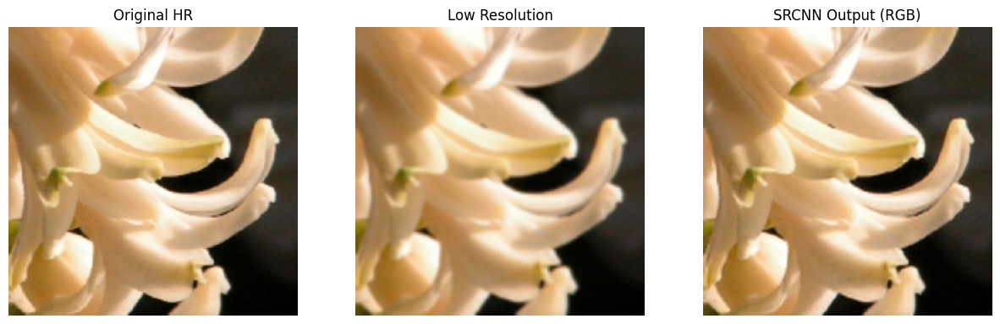

In [10]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, transform
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import tensorflow as tf
from tensorflow.keras import layers, models
from glob import glob

# تعریف آماده‌سازی تصویر Low-Resolution
def prepare_lr(img, scale=2):
    img = color.rgb2ycbcr(img)[:, :, 0]
    img = transform.resize(img, (img.shape[0]//scale, img.shape[1]//scale), anti_aliasing=True)
    img = transform.resize(img, (img.shape[0]*scale, img.shape[1]*scale), anti_aliasing=True)
    return img

# بارگذاری همه تصاویر
def load_images(path):
    files = glob(os.path.join(path, '*.bmp')) + glob(os.path.join(path, '*.png')) + glob(os.path.join(path, '*.jpg'))
    images = []
    for file in files:
        img = io.imread(file)
        img = transform.resize(img, (256, 256), anti_aliasing=True)
        images.append(img)
    return images

dataset_path = '/content/drive/MyDrive/basicCNN/91images/'  # مسیر دیتاست
images = load_images(dataset_path)

# آماده‌سازی داده‌ها
x_train = []
y_train = []

for img in images:
    lr = prepare_lr(img)
    hr = color.rgb2ycbcr(img)[:, :, 0]
    x_train.append(lr)
    y_train.append(hr)

x_train = np.expand_dims(np.array(x_train), -1)
y_train = np.expand_dims(np.array(y_train), -1)

# ساخت مدل SRCNN
model = models.Sequential([
    layers.Conv2D(64, (9,9), activation='relu', padding='same', input_shape=(None, None, 1)),
    layers.Conv2D(32, (5,5), activation='relu', padding='same'),
    layers.Conv2D(1, (5,5), activation='linear', padding='same')
])

model.compile(optimizer='adam', loss='mse')

# آموزش مدل
model.fit(x_train, y_train, batch_size=4, epochs=1000, verbose=2)

# تست روی یک تصویر
idx = np.random.randint(0, len(images))
original_img = transform.resize(images[idx], (256, 256), anti_aliasing=True)
img_ycbcr = color.rgb2ycbcr(original_img)
lr_img = prepare_lr(original_img)

# مدل روی Y کانال کار می‌کند
test_lr = np.expand_dims(lr_img, axis=(0, -1))
predicted_y = model.predict(test_lr)[0, ..., 0]

# بازیابی کانال‌های Cb و Cr و بازسازی تصویر رنگی
cb = transform.resize(img_ycbcr[:, :, 1], predicted_y.shape, anti_aliasing=True)
cr = transform.resize(img_ycbcr[:, :, 2], predicted_y.shape, anti_aliasing=True)
output_ycbcr = np.stack((predicted_y, cb, cr), axis=-1)
output_rgb = np.clip(color.ycbcr2rgb(output_ycbcr), 0, 1)

# محاسبه ارزیابی روی کانال Y
test_hr = img_ycbcr[:, :, 0]
print("PSNR (Y channel):", psnr(test_hr, predicted_y, data_range=1.0))
print("SSIM (Y channel):", ssim(test_hr, predicted_y, data_range=1.0))

# نمایش نتایج
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.title('Original HR')
plt.imshow(original_img)
plt.axis('off')

plt.subplot(1,3,2)
plt.title('Low Resolution')
lr_show = color.ycbcr2rgb(np.stack((lr_img, cb, cr), axis=-1))
plt.imshow(np.clip(lr_show, 0, 1))
plt.axis('off')

plt.subplot(1,3,3)
plt.title('SRCNN Output (RGB)')
plt.imshow(output_rgb)
plt.axis('off')

plt.show()

cell code: 19

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 - 12s - 500ms/step - loss: 4656.0166
Epoch 2/100
23/23 - 1s - 42ms/step - loss: 446.5779
Epoch 3/100
23/23 - 1s - 41ms/step - loss: 282.8958
Epoch 4/100
23/23 - 1s - 55ms/step - loss: 181.5794
Epoch 5/100
23/23 - 1s - 42ms/step - loss: 131.6972
Epoch 6/100
23/23 - 1s - 55ms/step - loss: 94.9868
Epoch 7/100
23/23 - 1s - 42ms/step - loss: 72.9145
Epoch 8/100
23/23 - 1s - 43ms/step - loss: 61.9619
Epoch 9/100
23/23 - 1s - 54ms/step - loss: 56.0094
Epoch 10/100
23/23 - 1s - 41ms/step - loss: 51.2312
Epoch 11/100
23/23 - 1s - 41ms/step - loss: 44.2178
Epoch 12/100
23/23 - 1s - 55ms/step - loss: 48.5331
Epoch 13/100
23/23 - 1s - 54ms/step - loss: 69.0552
Epoch 14/100
23/23 - 1s - 55ms/step - loss: 46.6238
Epoch 15/100
23/23 - 1s - 54ms/step - loss: 38.0699
Epoch 16/100
23/23 - 1s - 56ms/step - loss: 35.6522
Epoch 17/100
23/23 - 1s - 42ms/step - loss: 34.3418
Epoch 18/100
23/23 - 1s - 42ms/step - loss: 33.1373
Epoch 19/100
23/23 - 1s - 43ms/step - loss: 32.1518
Epoch 20/100
23/23 - 1s -

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 605ms/step
PSNR (Y channel): -8.553528766768492
SSIM (Y channel): 0.9385958534891158


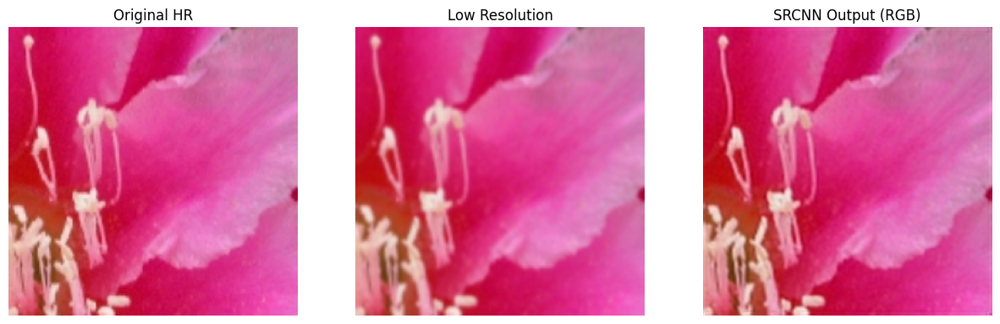

In [6]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, transform
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import tensorflow as tf
from tensorflow.keras import layers, models
from glob import glob

# تعریف آماده‌سازی تصویر Low-Resolution
def prepare_lr(img, scale=2):
    img = color.rgb2ycbcr(img)[:, :, 0]
    img = transform.resize(img, (img.shape[0]//scale, img.shape[1]//scale), anti_aliasing=True)
    img = transform.resize(img, (img.shape[0]*scale, img.shape[1]*scale), anti_aliasing=True)
    return img

# بارگذاری همه تصاویر
def load_images(path):
    files = glob(os.path.join(path, '*.bmp')) + glob(os.path.join(path, '*.png')) + glob(os.path.join(path, '*.jpg'))
    images = []
    for file in files:
        img = io.imread(file)
        img = transform.resize(img, (256, 256), anti_aliasing=True)
        images.append(img)
    return images

dataset_path = '/content/drive/MyDrive/basicCNN/91images/'  # مسیر دیتاست
images = load_images(dataset_path)

# آماده‌سازی داده‌ها
x_train = []
y_train = []

for img in images:
    lr = prepare_lr(img)
    hr = color.rgb2ycbcr(img)[:, :, 0]
    x_train.append(lr)
    y_train.append(hr)

x_train = np.expand_dims(np.array(x_train), -1)
y_train = np.expand_dims(np.array(y_train), -1)

# ساخت مدل SRCNN
model = models.Sequential([
    layers.Conv2D(64, (9,9), activation='relu', padding='same', input_shape=(None, None, 1)),
    layers.Conv2D(64, (3,3), activation='relu', padding='same'),
    layers.Conv2D(32, (3,3), activation='relu', padding='same'),
    layers.Conv2D(32, (3,3), activation='relu', padding='same'),
    layers.Conv2D(16, (3,3), activation='relu', padding='same'),
    layers.Conv2D(1, (5,5), activation='linear', padding='same')
])

model.compile(optimizer='adam', loss='mse')

# آموزش مدل
model.fit(x_train, y_train, batch_size=4, epochs=100, verbose=2)

# تست روی یک تصویر
idx = np.random.randint(0, len(images))
original_img = transform.resize(images[idx], (256, 256), anti_aliasing=True)
img_ycbcr = color.rgb2ycbcr(original_img)
lr_img = prepare_lr(original_img)

# مدل روی Y کانال کار می‌کند
test_lr = np.expand_dims(lr_img, axis=(0, -1))
predicted_y = model.predict(test_lr)[0, ..., 0]

# بازیابی کانال‌های Cb و Cr و بازسازی تصویر رنگی
cb = transform.resize(img_ycbcr[:, :, 1], predicted_y.shape, anti_aliasing=True)
cr = transform.resize(img_ycbcr[:, :, 2], predicted_y.shape, anti_aliasing=True)
output_ycbcr = np.stack((predicted_y, cb, cr), axis=-1)
output_rgb = np.clip(color.ycbcr2rgb(output_ycbcr), 0, 1)

# محاسبه ارزیابی روی کانال Y
test_hr = img_ycbcr[:, :, 0]
print("PSNR (Y channel):", psnr(test_hr, predicted_y, data_range=1.0))
print("SSIM (Y channel):", ssim(test_hr, predicted_y, data_range=1.0))

# نمایش نتایج
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.title('Original HR')
plt.imshow(original_img)
plt.axis('off')

plt.subplot(1,3,2)
plt.title('Low Resolution')
lr_show = color.ycbcr2rgb(np.stack((lr_img, cb, cr), axis=-1))
plt.imshow(np.clip(lr_show, 0, 1))
plt.axis('off')

plt.subplot(1,3,3)
plt.title('SRCNN Output (RGB)')
plt.imshow(output_rgb)
plt.axis('off')

plt.show()

cell code: 20

Epoch 1/200


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 - 5s - 222ms/step - loss: 3724.4976
Epoch 2/200
23/23 - 1s - 41ms/step - loss: 436.1124
Epoch 3/200
23/23 - 1s - 41ms/step - loss: 294.9680
Epoch 4/200
23/23 - 1s - 55ms/step - loss: 166.0126
Epoch 5/200
23/23 - 1s - 41ms/step - loss: 108.4365
Epoch 6/200
23/23 - 1s - 55ms/step - loss: 84.1654
Epoch 7/200
23/23 - 1s - 55ms/step - loss: 71.7445
Epoch 8/200
23/23 - 1s - 41ms/step - loss: 78.1501
Epoch 9/200
23/23 - 1s - 56ms/step - loss: 59.3401
Epoch 10/200
23/23 - 1s - 43ms/step - loss: 49.9611
Epoch 11/200
23/23 - 1s - 42ms/step - loss: 46.0539
Epoch 12/200
23/23 - 1s - 42ms/step - loss: 42.9346
Epoch 13/200
23/23 - 1s - 41ms/step - loss: 40.9452
Epoch 14/200
23/23 - 1s - 55ms/step - loss: 39.0609
Epoch 15/200
23/23 - 1s - 55ms/step - loss: 39.4959
Epoch 16/200
23/23 - 1s - 54ms/step - loss: 35.6442
Epoch 17/200
23/23 - 1s - 56ms/step - loss: 36.3041
Epoch 18/200
23/23 - 1s - 46ms/step - loss: 44.4382
Epoch 19/200
23/23 - 1s - 43ms/step - loss: 39.0687
Epoch 20/200
23/23 - 1s - 

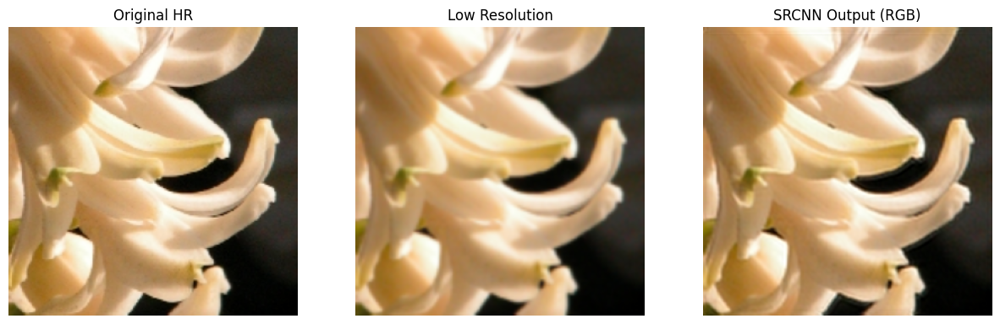

In [8]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, transform
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import tensorflow as tf
from tensorflow.keras import layers, models
from glob import glob

# تعریف آماده‌سازی تصویر Low-Resolution
def prepare_lr(img, scale=2):
    img = color.rgb2ycbcr(img)[:, :, 0]
    img = transform.resize(img, (img.shape[0]//scale, img.shape[1]//scale), anti_aliasing=True)
    img = transform.resize(img, (img.shape[0]*scale, img.shape[1]*scale), anti_aliasing=True)
    return img

# بارگذاری همه تصاویر
def load_images(path):
    files = glob(os.path.join(path, '*.bmp')) + glob(os.path.join(path, '*.png')) + glob(os.path.join(path, '*.jpg'))
    images = []
    for file in files:
        img = io.imread(file)
        img = transform.resize(img, (256, 256), anti_aliasing=True)
        images.append(img)
    return images

dataset_path = '/content/drive/MyDrive/basicCNN/91images/'  # مسیر دیتاست
images = load_images(dataset_path)

# آماده‌سازی داده‌ها
x_train = []
y_train = []

for img in images:
    lr = prepare_lr(img)
    hr = color.rgb2ycbcr(img)[:, :, 0]
    x_train.append(lr)
    y_train.append(hr)

x_train = np.expand_dims(np.array(x_train), -1)
y_train = np.expand_dims(np.array(y_train), -1)

# ساخت مدل SRCNN
model = models.Sequential([
    layers.Conv2D(64, (9,9), activation='relu', padding='same', input_shape=(None, None, 1)),
    layers.Conv2D(64, (3,3), activation='relu', padding='same'),
    layers.Conv2D(32, (3,3), activation='relu', padding='same'),
    layers.Conv2D(32, (3,3), activation='relu', padding='same'),
    layers.Conv2D(16, (3,3), activation='relu', padding='same'),
    layers.Conv2D(1, (5,5), activation='linear', padding='same')
])

model.compile(optimizer='adam', loss='mse')

# آموزش مدل
model.fit(x_train, y_train, batch_size=4, epochs=200, verbose=2)

# تست روی یک تصویر
idx = np.random.randint(0, len(images))
original_img = transform.resize(images[idx], (256, 256), anti_aliasing=True)
img_ycbcr = color.rgb2ycbcr(original_img)
lr_img = prepare_lr(original_img)

# مدل روی Y کانال کار می‌کند
test_lr = np.expand_dims(lr_img, axis=(0, -1))
predicted_y = model.predict(test_lr)[0, ..., 0]

# بازیابی کانال‌های Cb و Cr و بازسازی تصویر رنگی
cb = transform.resize(img_ycbcr[:, :, 1], predicted_y.shape, anti_aliasing=True)
cr = transform.resize(img_ycbcr[:, :, 2], predicted_y.shape, anti_aliasing=True)
output_ycbcr = np.stack((predicted_y, cb, cr), axis=-1)
output_rgb = np.clip(color.ycbcr2rgb(output_ycbcr), 0, 1)

# محاسبه ارزیابی روی کانال Y
test_hr = img_ycbcr[:, :, 0]
print("PSNR (Y channel):", psnr(test_hr, predicted_y, data_range=1.0))
print("SSIM (Y channel):", ssim(test_hr, predicted_y, data_range=1.0))

# نمایش نتایج
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.title('Original HR')
plt.imshow(original_img)
plt.axis('off')

plt.subplot(1,3,2)
plt.title('Low Resolution')
lr_show = color.ycbcr2rgb(np.stack((lr_img, cb, cr), axis=-1))
plt.imshow(np.clip(lr_show, 0, 1))
plt.axis('off')

plt.subplot(1,3,3)
plt.title('SRCNN Output (RGB)')
plt.imshow(output_rgb)
plt.axis('off')

plt.show()

cell code: 21

Epoch 1/300


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 - 5s - 214ms/step - loss: 3172.4131
Epoch 2/300
23/23 - 1s - 42ms/step - loss: 357.8126
Epoch 3/300
23/23 - 1s - 42ms/step - loss: 300.8600
Epoch 4/300
23/23 - 1s - 41ms/step - loss: 195.6626
Epoch 5/300
23/23 - 1s - 55ms/step - loss: 135.6943
Epoch 6/300
23/23 - 1s - 55ms/step - loss: 108.5439
Epoch 7/300
23/23 - 1s - 55ms/step - loss: 87.5694
Epoch 8/300
23/23 - 1s - 54ms/step - loss: 76.6306
Epoch 9/300
23/23 - 1s - 55ms/step - loss: 68.5713
Epoch 10/300
23/23 - 1s - 41ms/step - loss: 62.1847
Epoch 11/300
23/23 - 1s - 41ms/step - loss: 57.4042
Epoch 12/300
23/23 - 1s - 42ms/step - loss: 52.4287
Epoch 13/300
23/23 - 1s - 42ms/step - loss: 45.4977
Epoch 14/300
23/23 - 1s - 55ms/step - loss: 68.2418
Epoch 15/300
23/23 - 1s - 54ms/step - loss: 47.4185
Epoch 16/300
23/23 - 1s - 42ms/step - loss: 40.6540
Epoch 17/300
23/23 - 1s - 55ms/step - loss: 36.1809
Epoch 18/300
23/23 - 1s - 42ms/step - loss: 33.9663
Epoch 19/300
23/23 - 1s - 55ms/step - loss: 32.6455
Epoch 20/300
23/23 - 1s -

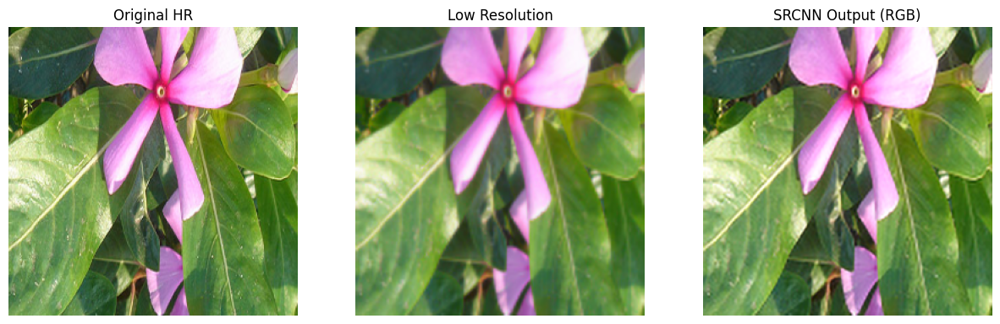

In [12]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, transform
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import tensorflow as tf
from tensorflow.keras import layers, models
from glob import glob

# تعریف آماده‌سازی تصویر Low-Resolution
def prepare_lr(img, scale=2):
    img = color.rgb2ycbcr(img)[:, :, 0]
    img = transform.resize(img, (img.shape[0]//scale, img.shape[1]//scale), anti_aliasing=True)
    img = transform.resize(img, (img.shape[0]*scale, img.shape[1]*scale), anti_aliasing=True)
    return img

# بارگذاری همه تصاویر
def load_images(path):
    files = glob(os.path.join(path, '*.bmp')) + glob(os.path.join(path, '*.png')) + glob(os.path.join(path, '*.jpg'))
    images = []
    for file in files:
        img = io.imread(file)
        img = transform.resize(img, (256, 256), anti_aliasing=True)
        images.append(img)
    return images

dataset_path = '/content/drive/MyDrive/basicCNN/91images/'  # مسیر دیتاست
images = load_images(dataset_path)

# آماده‌سازی داده‌ها
x_train = []
y_train = []

for img in images:
    lr = prepare_lr(img)
    hr = color.rgb2ycbcr(img)[:, :, 0]
    x_train.append(lr)
    y_train.append(hr)

x_train = np.expand_dims(np.array(x_train), -1)
y_train = np.expand_dims(np.array(y_train), -1)

# ساخت مدل SRCNN
model = models.Sequential([
    layers.Conv2D(64, (9,9), activation='relu', padding='same', input_shape=(None, None, 1)),
    layers.Conv2D(64, (3,3), activation='relu', padding='same'),
    layers.Conv2D(32, (3,3), activation='relu', padding='same'),
    layers.Conv2D(32, (3,3), activation='relu', padding='same'),
    layers.Conv2D(16, (3,3), activation='relu', padding='same'),
    layers.Conv2D(1, (5,5), activation='linear', padding='same')
])

model.compile(optimizer='adam', loss='mse')

# آموزش مدل
model.fit(x_train, y_train, batch_size=4, epochs=300, verbose=2)

# تست روی یک تصویر
idx = np.random.randint(0, len(images))
original_img = transform.resize(images[idx], (256, 256), anti_aliasing=True)
img_ycbcr = color.rgb2ycbcr(original_img)
lr_img = prepare_lr(original_img)

# مدل روی Y کانال کار می‌کند
test_lr = np.expand_dims(lr_img, axis=(0, -1))
predicted_y = model.predict(test_lr)[0, ..., 0]

# بازیابی کانال‌های Cb و Cr و بازسازی تصویر رنگی
cb = transform.resize(img_ycbcr[:, :, 1], predicted_y.shape, anti_aliasing=True)
cr = transform.resize(img_ycbcr[:, :, 2], predicted_y.shape, anti_aliasing=True)
output_ycbcr = np.stack((predicted_y, cb, cr), axis=-1)
output_rgb = np.clip(color.ycbcr2rgb(output_ycbcr), 0, 1)

# محاسبه ارزیابی روی کانال Y
test_hr = img_ycbcr[:, :, 0]
print("PSNR (Y channel):", psnr(test_hr, predicted_y, data_range=1.0))
print("SSIM (Y channel):", ssim(test_hr, predicted_y, data_range=1.0))

# نمایش نتایج
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.title('Original HR')
plt.imshow(original_img)
plt.axis('off')

plt.subplot(1,3,2)
plt.title('Low Resolution')
lr_show = color.ycbcr2rgb(np.stack((lr_img, cb, cr), axis=-1))
plt.imshow(np.clip(lr_show, 0, 1))
plt.axis('off')

plt.subplot(1,3,3)
plt.title('SRCNN Output (RGB)')
plt.imshow(output_rgb)
plt.axis('off')

plt.show()

cell code: 22

Epoch 1/400


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 - 5s - 198ms/step - loss: 3765.2249
Epoch 2/400
23/23 - 3s - 131ms/step - loss: 376.8979
Epoch 3/400
23/23 - 1s - 50ms/step - loss: 221.8663
Epoch 4/400
23/23 - 1s - 41ms/step - loss: 132.0627
Epoch 5/400
23/23 - 1s - 42ms/step - loss: 98.1036
Epoch 6/400
23/23 - 1s - 54ms/step - loss: 78.8311
Epoch 7/400
23/23 - 1s - 54ms/step - loss: 69.8706
Epoch 8/400
23/23 - 1s - 42ms/step - loss: 62.8415
Epoch 9/400
23/23 - 1s - 42ms/step - loss: 58.4913
Epoch 10/400
23/23 - 1s - 55ms/step - loss: 53.0608
Epoch 11/400
23/23 - 1s - 42ms/step - loss: 48.8830
Epoch 12/400
23/23 - 1s - 42ms/step - loss: 45.6813
Epoch 13/400
23/23 - 1s - 55ms/step - loss: 42.9603
Epoch 14/400
23/23 - 1s - 42ms/step - loss: 40.5657
Epoch 15/400
23/23 - 1s - 54ms/step - loss: 39.1073
Epoch 16/400
23/23 - 1s - 42ms/step - loss: 38.2585
Epoch 17/400
23/23 - 1s - 54ms/step - loss: 37.9166
Epoch 18/400
23/23 - 1s - 42ms/step - loss: 46.0414
Epoch 19/400
23/23 - 1s - 42ms/step - loss: 33.8732
Epoch 20/400
23/23 - 1s - 

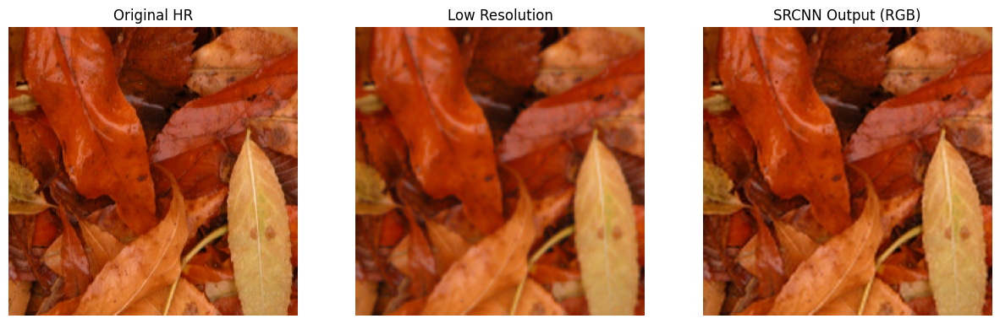

In [13]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, transform
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import tensorflow as tf
from tensorflow.keras import layers, models
from glob import glob

# تعریف آماده‌سازی تصویر Low-Resolution
def prepare_lr(img, scale=2):
    img = color.rgb2ycbcr(img)[:, :, 0]
    img = transform.resize(img, (img.shape[0]//scale, img.shape[1]//scale), anti_aliasing=True)
    img = transform.resize(img, (img.shape[0]*scale, img.shape[1]*scale), anti_aliasing=True)
    return img

# بارگذاری همه تصاویر
def load_images(path):
    files = glob(os.path.join(path, '*.bmp')) + glob(os.path.join(path, '*.png')) + glob(os.path.join(path, '*.jpg'))
    images = []
    for file in files:
        img = io.imread(file)
        img = transform.resize(img, (256, 256), anti_aliasing=True)
        images.append(img)
    return images

dataset_path = '/content/drive/MyDrive/basicCNN/91images/'  # مسیر دیتاست
images = load_images(dataset_path)

# آماده‌سازی داده‌ها
x_train = []
y_train = []

for img in images:
    lr = prepare_lr(img)
    hr = color.rgb2ycbcr(img)[:, :, 0]
    x_train.append(lr)
    y_train.append(hr)

x_train = np.expand_dims(np.array(x_train), -1)
y_train = np.expand_dims(np.array(y_train), -1)

# ساخت مدل SRCNN
model = models.Sequential([
    layers.Conv2D(64, (9,9), activation='relu', padding='same', input_shape=(None, None, 1)),
    layers.Conv2D(64, (3,3), activation='relu', padding='same'),
    layers.Conv2D(32, (3,3), activation='relu', padding='same'),
    layers.Conv2D(32, (3,3), activation='relu', padding='same'),
    layers.Conv2D(16, (3,3), activation='relu', padding='same'),
    layers.Conv2D(1, (5,5), activation='linear', padding='same')
])

model.compile(optimizer='adam', loss='mse')

# آموزش مدل
model.fit(x_train, y_train, batch_size=4, epochs=400, verbose=2)

# تست روی یک تصویر
idx = np.random.randint(0, len(images))
original_img = transform.resize(images[idx], (256, 256), anti_aliasing=True)
img_ycbcr = color.rgb2ycbcr(original_img)
lr_img = prepare_lr(original_img)

# مدل روی Y کانال کار می‌کند
test_lr = np.expand_dims(lr_img, axis=(0, -1))
predicted_y = model.predict(test_lr)[0, ..., 0]

# بازیابی کانال‌های Cb و Cr و بازسازی تصویر رنگی
cb = transform.resize(img_ycbcr[:, :, 1], predicted_y.shape, anti_aliasing=True)
cr = transform.resize(img_ycbcr[:, :, 2], predicted_y.shape, anti_aliasing=True)
output_ycbcr = np.stack((predicted_y, cb, cr), axis=-1)
output_rgb = np.clip(color.ycbcr2rgb(output_ycbcr), 0, 1)

# محاسبه ارزیابی روی کانال Y
test_hr = img_ycbcr[:, :, 0]
print("PSNR (Y channel):", psnr(test_hr, predicted_y, data_range=1.0))
print("SSIM (Y channel):", ssim(test_hr, predicted_y, data_range=1.0))

# نمایش نتایج
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.title('Original HR')
plt.imshow(original_img)
plt.axis('off')

plt.subplot(1,3,2)
plt.title('Low Resolution')
lr_show = color.ycbcr2rgb(np.stack((lr_img, cb, cr), axis=-1))
plt.imshow(np.clip(lr_show, 0, 1))
plt.axis('off')

plt.subplot(1,3,3)
plt.title('SRCNN Output (RGB)')
plt.imshow(output_rgb)
plt.axis('off')

plt.show()

cell code: 23

Epoch 1/500


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 - 5s - 210ms/step - loss: 2220.6836
Epoch 2/500
23/23 - 1s - 41ms/step - loss: 426.2186
Epoch 3/500
23/23 - 1s - 41ms/step - loss: 253.6665
Epoch 4/500
23/23 - 1s - 41ms/step - loss: 156.5293
Epoch 5/500
23/23 - 1s - 54ms/step - loss: 105.5070
Epoch 6/500
23/23 - 1s - 56ms/step - loss: 78.8866
Epoch 7/500
23/23 - 1s - 55ms/step - loss: 65.5683
Epoch 8/500
23/23 - 1s - 41ms/step - loss: 72.7095
Epoch 9/500
23/23 - 1s - 42ms/step - loss: 61.3615
Epoch 10/500
23/23 - 1s - 43ms/step - loss: 50.6094
Epoch 11/500
23/23 - 1s - 54ms/step - loss: 46.1285
Epoch 12/500
23/23 - 1s - 41ms/step - loss: 51.7584
Epoch 13/500
23/23 - 1s - 55ms/step - loss: 47.5530
Epoch 14/500
23/23 - 1s - 41ms/step - loss: 40.0434
Epoch 15/500
23/23 - 1s - 41ms/step - loss: 37.8597
Epoch 16/500
23/23 - 1s - 55ms/step - loss: 36.3615
Epoch 17/500
23/23 - 1s - 42ms/step - loss: 35.9867
Epoch 18/500
23/23 - 1s - 54ms/step - loss: 95.9113
Epoch 19/500
23/23 - 1s - 42ms/step - loss: 49.1712
Epoch 20/500
23/23 - 1s - 

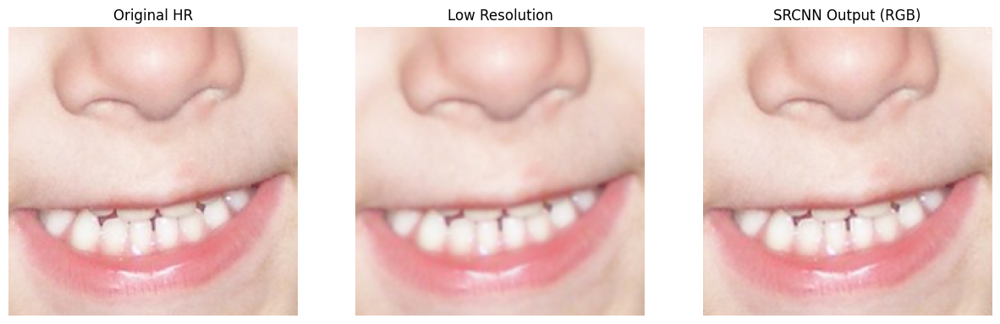

In [14]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, transform
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import tensorflow as tf
from tensorflow.keras import layers, models
from glob import glob

# تعریف آماده‌سازی تصویر Low-Resolution
def prepare_lr(img, scale=2):
    img = color.rgb2ycbcr(img)[:, :, 0]
    img = transform.resize(img, (img.shape[0]//scale, img.shape[1]//scale), anti_aliasing=True)
    img = transform.resize(img, (img.shape[0]*scale, img.shape[1]*scale), anti_aliasing=True)
    return img

# بارگذاری همه تصاویر
def load_images(path):
    files = glob(os.path.join(path, '*.bmp')) + glob(os.path.join(path, '*.png')) + glob(os.path.join(path, '*.jpg'))
    images = []
    for file in files:
        img = io.imread(file)
        img = transform.resize(img, (256, 256), anti_aliasing=True)
        images.append(img)
    return images

dataset_path = '/content/drive/MyDrive/basicCNN/91images/'  # مسیر دیتاست
images = load_images(dataset_path)

# آماده‌سازی داده‌ها
x_train = []
y_train = []

for img in images:
    lr = prepare_lr(img)
    hr = color.rgb2ycbcr(img)[:, :, 0]
    x_train.append(lr)
    y_train.append(hr)

x_train = np.expand_dims(np.array(x_train), -1)
y_train = np.expand_dims(np.array(y_train), -1)

# ساخت مدل SRCNN
model = models.Sequential([
    layers.Conv2D(64, (9,9), activation='relu', padding='same', input_shape=(None, None, 1)),
    layers.Conv2D(64, (3,3), activation='relu', padding='same'),
    layers.Conv2D(32, (3,3), activation='relu', padding='same'),
    layers.Conv2D(32, (3,3), activation='relu', padding='same'),
    layers.Conv2D(16, (3,3), activation='relu', padding='same'),
    layers.Conv2D(1, (5,5), activation='linear', padding='same')
])

model.compile(optimizer='adam', loss='mse')

# آموزش مدل
model.fit(x_train, y_train, batch_size=4, epochs=500, verbose=2)

# تست روی یک تصویر
idx = np.random.randint(0, len(images))
original_img = transform.resize(images[idx], (256, 256), anti_aliasing=True)
img_ycbcr = color.rgb2ycbcr(original_img)
lr_img = prepare_lr(original_img)

# مدل روی Y کانال کار می‌کند
test_lr = np.expand_dims(lr_img, axis=(0, -1))
predicted_y = model.predict(test_lr)[0, ..., 0]

# بازیابی کانال‌های Cb و Cr و بازسازی تصویر رنگی
cb = transform.resize(img_ycbcr[:, :, 1], predicted_y.shape, anti_aliasing=True)
cr = transform.resize(img_ycbcr[:, :, 2], predicted_y.shape, anti_aliasing=True)
output_ycbcr = np.stack((predicted_y, cb, cr), axis=-1)
output_rgb = np.clip(color.ycbcr2rgb(output_ycbcr), 0, 1)

# محاسبه ارزیابی روی کانال Y
test_hr = img_ycbcr[:, :, 0]
print("PSNR (Y channel):", psnr(test_hr, predicted_y, data_range=1.0))
print("SSIM (Y channel):", ssim(test_hr, predicted_y, data_range=1.0))

# نمایش نتایج
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.title('Original HR')
plt.imshow(original_img)
plt.axis('off')

plt.subplot(1,3,2)
plt.title('Low Resolution')
lr_show = color.ycbcr2rgb(np.stack((lr_img, cb, cr), axis=-1))
plt.imshow(np.clip(lr_show, 0, 1))
plt.axis('off')

plt.subplot(1,3,3)
plt.title('SRCNN Output (RGB)')
plt.imshow(output_rgb)
plt.axis('off')

plt.show()

cell code: 24

Epoch 1/600


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 - 4s - 190ms/step - loss: 2639.4294
Epoch 2/600
23/23 - 3s - 141ms/step - loss: 359.5060
Epoch 3/600
23/23 - 1s - 42ms/step - loss: 210.5972
Epoch 4/600
23/23 - 1s - 54ms/step - loss: 130.5114
Epoch 5/600
23/23 - 1s - 41ms/step - loss: 86.5223
Epoch 6/600
23/23 - 1s - 41ms/step - loss: 69.8689
Epoch 7/600
23/23 - 1s - 41ms/step - loss: 62.4116
Epoch 8/600
23/23 - 1s - 41ms/step - loss: 50.0170
Epoch 9/600
23/23 - 1s - 55ms/step - loss: 42.2843
Epoch 10/600
23/23 - 1s - 55ms/step - loss: 38.3717
Epoch 11/600
23/23 - 1s - 42ms/step - loss: 34.6020
Epoch 12/600
23/23 - 1s - 55ms/step - loss: 34.8170
Epoch 13/600
23/23 - 1s - 42ms/step - loss: 54.0410
Epoch 14/600
23/23 - 1s - 41ms/step - loss: 41.4440
Epoch 15/600
23/23 - 1s - 55ms/step - loss: 32.8460
Epoch 16/600
23/23 - 1s - 54ms/step - loss: 31.0277
Epoch 17/600
23/23 - 1s - 55ms/step - loss: 29.5688
Epoch 18/600
23/23 - 1s - 42ms/step - loss: 28.6356
Epoch 19/600
23/23 - 1s - 54ms/step - loss: 28.4397
Epoch 20/600
23/23 - 1s - 

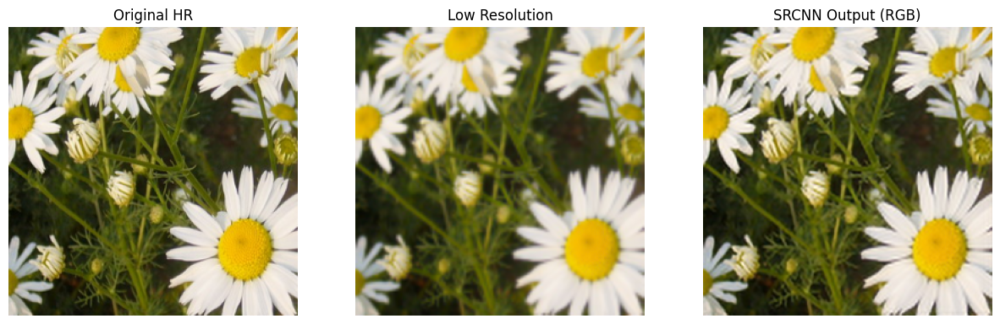

In [15]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, transform
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import tensorflow as tf
from tensorflow.keras import layers, models
from glob import glob

# تعریف آماده‌سازی تصویر Low-Resolution
def prepare_lr(img, scale=2):
    img = color.rgb2ycbcr(img)[:, :, 0]
    img = transform.resize(img, (img.shape[0]//scale, img.shape[1]//scale), anti_aliasing=True)
    img = transform.resize(img, (img.shape[0]*scale, img.shape[1]*scale), anti_aliasing=True)
    return img

# بارگذاری همه تصاویر
def load_images(path):
    files = glob(os.path.join(path, '*.bmp')) + glob(os.path.join(path, '*.png')) + glob(os.path.join(path, '*.jpg'))
    images = []
    for file in files:
        img = io.imread(file)
        img = transform.resize(img, (256, 256), anti_aliasing=True)
        images.append(img)
    return images

dataset_path = '/content/drive/MyDrive/basicCNN/91images/'  # مسیر دیتاست
images = load_images(dataset_path)

# آماده‌سازی داده‌ها
x_train = []
y_train = []

for img in images:
    lr = prepare_lr(img)
    hr = color.rgb2ycbcr(img)[:, :, 0]
    x_train.append(lr)
    y_train.append(hr)

x_train = np.expand_dims(np.array(x_train), -1)
y_train = np.expand_dims(np.array(y_train), -1)

# ساخت مدل SRCNN
model = models.Sequential([
    layers.Conv2D(64, (9,9), activation='relu', padding='same', input_shape=(None, None, 1)),
    layers.Conv2D(64, (3,3), activation='relu', padding='same'),
    layers.Conv2D(32, (3,3), activation='relu', padding='same'),
    layers.Conv2D(32, (3,3), activation='relu', padding='same'),
    layers.Conv2D(16, (3,3), activation='relu', padding='same'),
    layers.Conv2D(1, (5,5), activation='linear', padding='same')
])

model.compile(optimizer='adam', loss='mse')

# آموزش مدل
model.fit(x_train, y_train, batch_size=4, epochs=600, verbose=2)

# تست روی یک تصویر
idx = np.random.randint(0, len(images))
original_img = transform.resize(images[idx], (256, 256), anti_aliasing=True)
img_ycbcr = color.rgb2ycbcr(original_img)
lr_img = prepare_lr(original_img)

# مدل روی Y کانال کار می‌کند
test_lr = np.expand_dims(lr_img, axis=(0, -1))
predicted_y = model.predict(test_lr)[0, ..., 0]

# بازیابی کانال‌های Cb و Cr و بازسازی تصویر رنگی
cb = transform.resize(img_ycbcr[:, :, 1], predicted_y.shape, anti_aliasing=True)
cr = transform.resize(img_ycbcr[:, :, 2], predicted_y.shape, anti_aliasing=True)
output_ycbcr = np.stack((predicted_y, cb, cr), axis=-1)
output_rgb = np.clip(color.ycbcr2rgb(output_ycbcr), 0, 1)

# محاسبه ارزیابی روی کانال Y
test_hr = img_ycbcr[:, :, 0]
print("PSNR (Y channel):", psnr(test_hr, predicted_y, data_range=1.0))
print("SSIM (Y channel):", ssim(test_hr, predicted_y, data_range=1.0))

# نمایش نتایج
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.title('Original HR')
plt.imshow(original_img)
plt.axis('off')

plt.subplot(1,3,2)
plt.title('Low Resolution')
lr_show = color.ycbcr2rgb(np.stack((lr_img, cb, cr), axis=-1))
plt.imshow(np.clip(lr_show, 0, 1))
plt.axis('off')

plt.subplot(1,3,3)
plt.title('SRCNN Output (RGB)')
plt.imshow(output_rgb)
plt.axis('off')

plt.show()

cell code: 25

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/700
23/23 - 13s - 554ms/step - loss: 3661.9509
Epoch 2/700
23/23 - 1s - 39ms/step - loss: 426.8473
Epoch 3/700
23/23 - 1s - 56ms/step - loss: 258.6425
Epoch 4/700
23/23 - 1s - 41ms/step - loss: 149.0111
Epoch 5/700
23/23 - 1s - 54ms/step - loss: 109.4632
Epoch 6/700
23/23 - 1s - 53ms/step - loss: 83.8014
Epoch 7/700
23/23 - 1s - 39ms/step - loss: 75.1879
Epoch 8/700
23/23 - 1s - 55ms/step - loss: 64.8798
Epoch 9/700
23/23 - 1s - 55ms/step - loss: 60.3659
Epoch 10/700
23/23 - 1s - 55ms/step - loss: 57.0998
Epoch 11/700
23/23 - 1s - 55ms/step - loss: 54.4444
Epoch 12/700
23/23 - 1s - 40ms/step - loss: 51.4729
Epoch 13/700
23/23 - 1s - 54ms/step - loss: 48.7132
Epoch 14/700
23/23 - 1s - 56ms/step - loss: 46.1977
Epoch 15/700
23/23 - 1s - 41ms/step - loss: 61.6339
Epoch 16/700
23/23 - 1s - 41ms/step - loss: 58.0565
Epoch 17/700
23/23 - 1s - 41ms/step - loss: 44.2236
Epoch 18/700
23/23 - 1s - 54ms/step - loss: 41.4207
Epoch 19/700
23/23 - 1s - 40ms/step - loss: 39.1761
Epoch 20/700


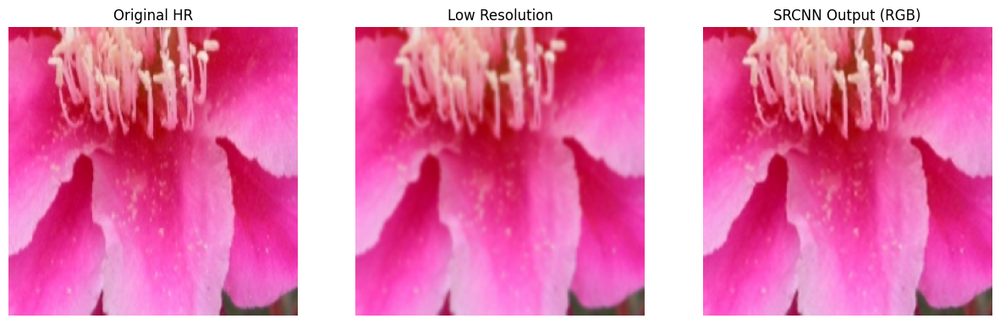

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, transform
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import tensorflow as tf
from tensorflow.keras import layers, models
from glob import glob

# تعریف آماده‌سازی تصویر Low-Resolution
def prepare_lr(img, scale=2):
    img = color.rgb2ycbcr(img)[:, :, 0]
    img = transform.resize(img, (img.shape[0]//scale, img.shape[1]//scale), anti_aliasing=True)
    img = transform.resize(img, (img.shape[0]*scale, img.shape[1]*scale), anti_aliasing=True)
    return img

# بارگذاری همه تصاویر
def load_images(path):
    files = glob(os.path.join(path, '*.bmp')) + glob(os.path.join(path, '*.png')) + glob(os.path.join(path, '*.jpg'))
    images = []
    for file in files:
        img = io.imread(file)
        img = transform.resize(img, (256, 256), anti_aliasing=True)
        images.append(img)
    return images

dataset_path = '/content/drive/MyDrive/basicCNN/91images/'  # مسیر دیتاست
images = load_images(dataset_path)

# آماده‌سازی داده‌ها
x_train = []
y_train = []

for img in images:
    lr = prepare_lr(img)
    hr = color.rgb2ycbcr(img)[:, :, 0]
    x_train.append(lr)
    y_train.append(hr)

x_train = np.expand_dims(np.array(x_train), -1)
y_train = np.expand_dims(np.array(y_train), -1)

# ساخت مدل SRCNN
model = models.Sequential([
    layers.Conv2D(64, (9,9), activation='relu', padding='same', input_shape=(None, None, 1)),
    layers.Conv2D(64, (3,3), activation='relu', padding='same'),
    layers.Conv2D(32, (3,3), activation='relu', padding='same'),
    layers.Conv2D(32, (3,3), activation='relu', padding='same'),
    layers.Conv2D(16, (3,3), activation='relu', padding='same'),
    layers.Conv2D(1, (5,5), activation='linear', padding='same')
])

model.compile(optimizer='adam', loss='mse')

# آموزش مدل
model.fit(x_train, y_train, batch_size=4, epochs=700, verbose=2)

# تست روی یک تصویر
idx = np.random.randint(0, len(images))
original_img = transform.resize(images[idx], (256, 256), anti_aliasing=True)
img_ycbcr = color.rgb2ycbcr(original_img)
lr_img = prepare_lr(original_img)

# مدل روی Y کانال کار می‌کند
test_lr = np.expand_dims(lr_img, axis=(0, -1))
predicted_y = model.predict(test_lr)[0, ..., 0]

# بازیابی کانال‌های Cb و Cr و بازسازی تصویر رنگی
cb = transform.resize(img_ycbcr[:, :, 1], predicted_y.shape, anti_aliasing=True)
cr = transform.resize(img_ycbcr[:, :, 2], predicted_y.shape, anti_aliasing=True)
output_ycbcr = np.stack((predicted_y, cb, cr), axis=-1)
output_rgb = np.clip(color.ycbcr2rgb(output_ycbcr), 0, 1)

# محاسبه ارزیابی روی کانال Y
test_hr = img_ycbcr[:, :, 0]
print("PSNR (Y channel):", psnr(test_hr, predicted_y, data_range=1.0))
print("SSIM (Y channel):", ssim(test_hr, predicted_y, data_range=1.0))

# نمایش نتایج
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.title('Original HR')
plt.imshow(original_img)
plt.axis('off')

plt.subplot(1,3,2)
plt.title('Low Resolution')
lr_show = color.ycbcr2rgb(np.stack((lr_img, cb, cr), axis=-1))
plt.imshow(np.clip(lr_show, 0, 1))
plt.axis('off')

plt.subplot(1,3,3)
plt.title('SRCNN Output (RGB)')
plt.imshow(output_rgb)
plt.axis('off')

plt.show()

cell code: 26

Epoch 1/800


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 - 4s - 184ms/step - loss: 3696.2654
Epoch 2/800
23/23 - 3s - 151ms/step - loss: 521.6489
Epoch 3/800
23/23 - 1s - 49ms/step - loss: 287.7388
Epoch 4/800
23/23 - 1s - 42ms/step - loss: 161.3697
Epoch 5/800
23/23 - 1s - 42ms/step - loss: 101.0406
Epoch 6/800
23/23 - 1s - 54ms/step - loss: 96.8573
Epoch 7/800
23/23 - 1s - 56ms/step - loss: 98.9067
Epoch 8/800
23/23 - 1s - 55ms/step - loss: 71.6642
Epoch 9/800
23/23 - 1s - 43ms/step - loss: 57.0491
Epoch 10/800
23/23 - 1s - 55ms/step - loss: 49.6203
Epoch 11/800
23/23 - 1s - 56ms/step - loss: 45.1872
Epoch 12/800
23/23 - 1s - 45ms/step - loss: 41.1671
Epoch 13/800
23/23 - 1s - 54ms/step - loss: 38.4028
Epoch 14/800
23/23 - 1s - 55ms/step - loss: 37.7120
Epoch 15/800
23/23 - 1s - 55ms/step - loss: 75.2542
Epoch 16/800
23/23 - 1s - 54ms/step - loss: 135.4128
Epoch 17/800
23/23 - 1s - 54ms/step - loss: 55.4173
Epoch 18/800
23/23 - 1s - 55ms/step - loss: 34.5139
Epoch 19/800
23/23 - 1s - 44ms/step - loss: 32.4484
Epoch 20/800
23/23 - 1s 

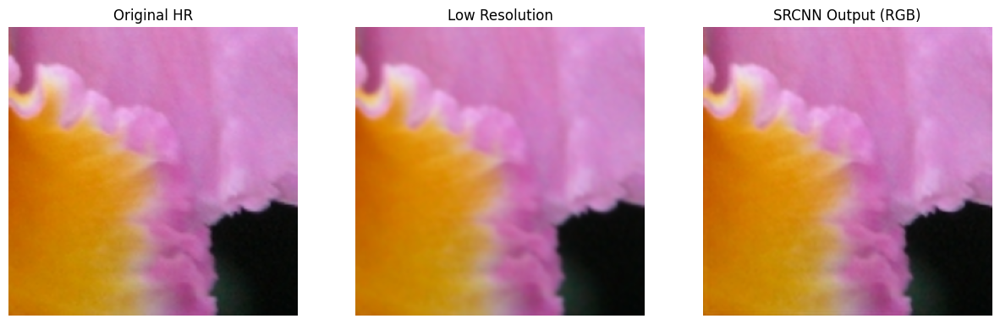

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, transform
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import tensorflow as tf
from tensorflow.keras import layers, models
from glob import glob

# تعریف آماده‌سازی تصویر Low-Resolution
def prepare_lr(img, scale=2):
    img = color.rgb2ycbcr(img)[:, :, 0]
    img = transform.resize(img, (img.shape[0]//scale, img.shape[1]//scale), anti_aliasing=True)
    img = transform.resize(img, (img.shape[0]*scale, img.shape[1]*scale), anti_aliasing=True)
    return img

# بارگذاری همه تصاویر
def load_images(path):
    files = glob(os.path.join(path, '*.bmp')) + glob(os.path.join(path, '*.png')) + glob(os.path.join(path, '*.jpg'))
    images = []
    for file in files:
        img = io.imread(file)
        img = transform.resize(img, (256, 256), anti_aliasing=True)
        images.append(img)
    return images

dataset_path = '/content/drive/MyDrive/basicCNN/91images/'  # مسیر دیتاست
images = load_images(dataset_path)

# آماده‌سازی داده‌ها
x_train = []
y_train = []

for img in images:
    lr = prepare_lr(img)
    hr = color.rgb2ycbcr(img)[:, :, 0]
    x_train.append(lr)
    y_train.append(hr)

x_train = np.expand_dims(np.array(x_train), -1)
y_train = np.expand_dims(np.array(y_train), -1)

# ساخت مدل SRCNN
model = models.Sequential([
    layers.Conv2D(64, (9,9), activation='relu', padding='same', input_shape=(None, None, 1)),
    layers.Conv2D(64, (3,3), activation='relu', padding='same'),
    layers.Conv2D(32, (3,3), activation='relu', padding='same'),
    layers.Conv2D(32, (3,3), activation='relu', padding='same'),
    layers.Conv2D(16, (3,3), activation='relu', padding='same'),
    layers.Conv2D(1, (5,5), activation='linear', padding='same')
])

model.compile(optimizer='adam', loss='mse')

# آموزش مدل
model.fit(x_train, y_train, batch_size=4, epochs=800, verbose=2)

# تست روی یک تصویر
idx = np.random.randint(0, len(images))
original_img = transform.resize(images[idx], (256, 256), anti_aliasing=True)
img_ycbcr = color.rgb2ycbcr(original_img)
lr_img = prepare_lr(original_img)

# مدل روی Y کانال کار می‌کند
test_lr = np.expand_dims(lr_img, axis=(0, -1))
predicted_y = model.predict(test_lr)[0, ..., 0]

# بازیابی کانال‌های Cb و Cr و بازسازی تصویر رنگی
cb = transform.resize(img_ycbcr[:, :, 1], predicted_y.shape, anti_aliasing=True)
cr = transform.resize(img_ycbcr[:, :, 2], predicted_y.shape, anti_aliasing=True)
output_ycbcr = np.stack((predicted_y, cb, cr), axis=-1)
output_rgb = np.clip(color.ycbcr2rgb(output_ycbcr), 0, 1)

# محاسبه ارزیابی روی کانال Y
test_hr = img_ycbcr[:, :, 0]
print("PSNR (Y channel):", psnr(test_hr, predicted_y, data_range=1.0))
print("SSIM (Y channel):", ssim(test_hr, predicted_y, data_range=1.0))

# نمایش نتایج
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.title('Original HR')
plt.imshow(original_img)
plt.axis('off')

plt.subplot(1,3,2)
plt.title('Low Resolution')
lr_show = color.ycbcr2rgb(np.stack((lr_img, cb, cr), axis=-1))
plt.imshow(np.clip(lr_show, 0, 1))
plt.axis('off')

plt.subplot(1,3,3)
plt.title('SRCNN Output (RGB)')
plt.imshow(output_rgb)
plt.axis('off')

plt.show()

cell code: 27

Epoch 1/900


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 - 5s - 215ms/step - loss: 3290.8472
Epoch 2/900
23/23 - 3s - 131ms/step - loss: 466.7525
Epoch 3/900
23/23 - 1s - 42ms/step - loss: 310.3754
Epoch 4/900
23/23 - 1s - 56ms/step - loss: 267.3207
Epoch 5/900
23/23 - 1s - 54ms/step - loss: 166.8451
Epoch 6/900
23/23 - 1s - 56ms/step - loss: 108.4861
Epoch 7/900
23/23 - 1s - 54ms/step - loss: 87.2889
Epoch 8/900
23/23 - 1s - 42ms/step - loss: 74.9824
Epoch 9/900
23/23 - 1s - 43ms/step - loss: 65.5646
Epoch 10/900
23/23 - 1s - 54ms/step - loss: 56.9028
Epoch 11/900
23/23 - 1s - 54ms/step - loss: 49.4916
Epoch 12/900
23/23 - 1s - 55ms/step - loss: 43.3133
Epoch 13/900
23/23 - 1s - 54ms/step - loss: 39.5183
Epoch 14/900
23/23 - 1s - 55ms/step - loss: 36.8142
Epoch 15/900
23/23 - 1s - 54ms/step - loss: 34.9805
Epoch 16/900
23/23 - 1s - 55ms/step - loss: 41.2205
Epoch 17/900
23/23 - 1s - 55ms/step - loss: 35.2862
Epoch 18/900
23/23 - 1s - 44ms/step - loss: 31.1592
Epoch 19/900
23/23 - 1s - 56ms/step - loss: 30.1804
Epoch 20/900
23/23 - 1s 

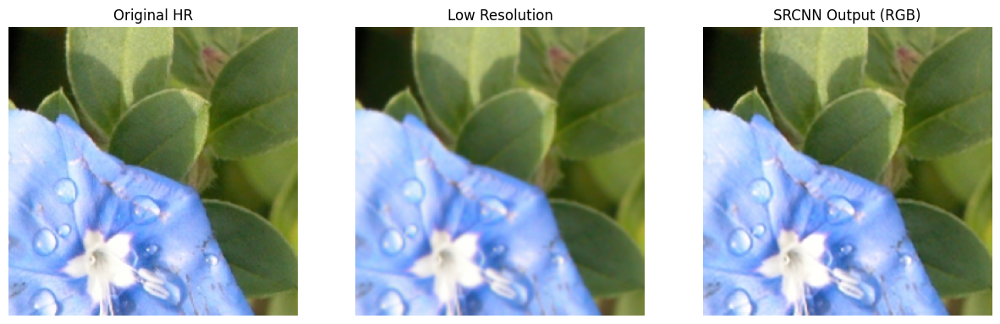

In [3]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, transform
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import tensorflow as tf
from tensorflow.keras import layers, models
from glob import glob

# تعریف آماده‌سازی تصویر Low-Resolution
def prepare_lr(img, scale=2):
    img = color.rgb2ycbcr(img)[:, :, 0]
    img = transform.resize(img, (img.shape[0]//scale, img.shape[1]//scale), anti_aliasing=True)
    img = transform.resize(img, (img.shape[0]*scale, img.shape[1]*scale), anti_aliasing=True)
    return img

# بارگذاری همه تصاویر
def load_images(path):
    files = glob(os.path.join(path, '*.bmp')) + glob(os.path.join(path, '*.png')) + glob(os.path.join(path, '*.jpg'))
    images = []
    for file in files:
        img = io.imread(file)
        img = transform.resize(img, (256, 256), anti_aliasing=True)
        images.append(img)
    return images

dataset_path = '/content/drive/MyDrive/basicCNN/91images/'  # مسیر دیتاست
images = load_images(dataset_path)

# آماده‌سازی داده‌ها
x_train = []
y_train = []

for img in images:
    lr = prepare_lr(img)
    hr = color.rgb2ycbcr(img)[:, :, 0]
    x_train.append(lr)
    y_train.append(hr)

x_train = np.expand_dims(np.array(x_train), -1)
y_train = np.expand_dims(np.array(y_train), -1)

# ساخت مدل SRCNN
model = models.Sequential([
    layers.Conv2D(64, (9,9), activation='relu', padding='same', input_shape=(None, None, 1)),
    layers.Conv2D(64, (3,3), activation='relu', padding='same'),
    layers.Conv2D(32, (3,3), activation='relu', padding='same'),
    layers.Conv2D(32, (3,3), activation='relu', padding='same'),
    layers.Conv2D(16, (3,3), activation='relu', padding='same'),
    layers.Conv2D(1, (5,5), activation='linear', padding='same')
])

model.compile(optimizer='adam', loss='mse')

# آموزش مدل
model.fit(x_train, y_train, batch_size=4, epochs=900, verbose=2)

# تست روی یک تصویر
idx = np.random.randint(0, len(images))
original_img = transform.resize(images[idx], (256, 256), anti_aliasing=True)
img_ycbcr = color.rgb2ycbcr(original_img)
lr_img = prepare_lr(original_img)

# مدل روی Y کانال کار می‌کند
test_lr = np.expand_dims(lr_img, axis=(0, -1))
predicted_y = model.predict(test_lr)[0, ..., 0]

# بازیابی کانال‌های Cb و Cr و بازسازی تصویر رنگی
cb = transform.resize(img_ycbcr[:, :, 1], predicted_y.shape, anti_aliasing=True)
cr = transform.resize(img_ycbcr[:, :, 2], predicted_y.shape, anti_aliasing=True)
output_ycbcr = np.stack((predicted_y, cb, cr), axis=-1)
output_rgb = np.clip(color.ycbcr2rgb(output_ycbcr), 0, 1)

# محاسبه ارزیابی روی کانال Y
test_hr = img_ycbcr[:, :, 0]
print("PSNR (Y channel):", psnr(test_hr, predicted_y, data_range=1.0))
print("SSIM (Y channel):", ssim(test_hr, predicted_y, data_range=1.0))

# نمایش نتایج
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.title('Original HR')
plt.imshow(original_img)
plt.axis('off')

plt.subplot(1,3,2)
plt.title('Low Resolution')
lr_show = color.ycbcr2rgb(np.stack((lr_img, cb, cr), axis=-1))
plt.imshow(np.clip(lr_show, 0, 1))
plt.axis('off')

plt.subplot(1,3,3)
plt.title('SRCNN Output (RGB)')
plt.imshow(output_rgb)
plt.axis('off')

plt.show()

Epoch 1/1000


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


23/23 - 5s - 202ms/step - loss: 3427.7668
Epoch 2/1000
23/23 - 1s - 42ms/step - loss: 474.7075
Epoch 3/1000
23/23 - 1s - 55ms/step - loss: 249.1104
Epoch 4/1000
23/23 - 1s - 54ms/step - loss: 135.7558
Epoch 5/1000
23/23 - 1s - 55ms/step - loss: 87.8341
Epoch 6/1000
23/23 - 1s - 42ms/step - loss: 68.0620
Epoch 7/1000
23/23 - 1s - 42ms/step - loss: 56.3418
Epoch 8/1000
23/23 - 1s - 55ms/step - loss: 49.4277
Epoch 9/1000
23/23 - 1s - 57ms/step - loss: 45.6057
Epoch 10/1000
23/23 - 1s - 56ms/step - loss: 52.2279
Epoch 11/1000
23/23 - 1s - 52ms/step - loss: 45.3580
Epoch 12/1000
23/23 - 1s - 56ms/step - loss: 39.1034
Epoch 13/1000
23/23 - 2s - 105ms/step - loss: 37.5950
Epoch 14/1000
23/23 - 1s - 54ms/step - loss: 35.3628
Epoch 15/1000
23/23 - 1s - 54ms/step - loss: 34.6688
Epoch 16/1000
23/23 - 1s - 43ms/step - loss: 33.6406
Epoch 17/1000
23/23 - 1s - 55ms/step - loss: 32.7311
Epoch 18/1000
23/23 - 1s - 44ms/step - loss: 31.9098
Epoch 19/1000
23/23 - 1s - 55ms/step - loss: 31.1636
Epoch 20

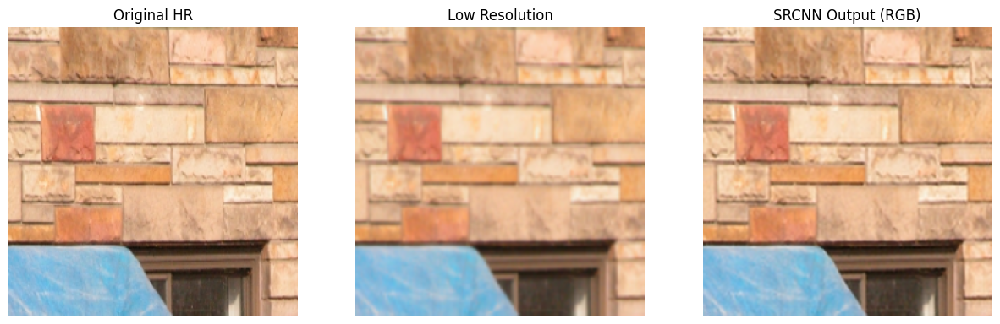

In [4]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, transform
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import tensorflow as tf
from tensorflow.keras import layers, models
from glob import glob

# تعریف آماده‌سازی تصویر Low-Resolution
def prepare_lr(img, scale=2):
    img = color.rgb2ycbcr(img)[:, :, 0]
    img = transform.resize(img, (img.shape[0]//scale, img.shape[1]//scale), anti_aliasing=True)
    img = transform.resize(img, (img.shape[0]*scale, img.shape[1]*scale), anti_aliasing=True)
    return img

# بارگذاری همه تصاویر
def load_images(path):
    files = glob(os.path.join(path, '*.bmp')) + glob(os.path.join(path, '*.png')) + glob(os.path.join(path, '*.jpg'))
    images = []
    for file in files:
        img = io.imread(file)
        img = transform.resize(img, (256, 256), anti_aliasing=True)
        images.append(img)
    return images

dataset_path = '/content/drive/MyDrive/basicCNN/91images/'  # مسیر دیتاست
images = load_images(dataset_path)

# آماده‌سازی داده‌ها
x_train = []
y_train = []

for img in images:
    lr = prepare_lr(img)
    hr = color.rgb2ycbcr(img)[:, :, 0]
    x_train.append(lr)
    y_train.append(hr)

x_train = np.expand_dims(np.array(x_train), -1)
y_train = np.expand_dims(np.array(y_train), -1)

# ساخت مدل SRCNN
model = models.Sequential([
    layers.Conv2D(64, (9,9), activation='relu', padding='same', input_shape=(None, None, 1)),
    layers.Conv2D(64, (3,3), activation='relu', padding='same'),
    layers.Conv2D(32, (3,3), activation='relu', padding='same'),
    layers.Conv2D(32, (3,3), activation='relu', padding='same'),
    layers.Conv2D(16, (3,3), activation='relu', padding='same'),
    layers.Conv2D(1, (5,5), activation='linear', padding='same')
])

model.compile(optimizer='adam', loss='mse')

# آموزش مدل
model.fit(x_train, y_train, batch_size=4, epochs=1000, verbose=2)

# تست روی یک تصویر
idx = np.random.randint(0, len(images))
original_img = transform.resize(images[idx], (256, 256), anti_aliasing=True)
img_ycbcr = color.rgb2ycbcr(original_img)
lr_img = prepare_lr(original_img)

# مدل روی Y کانال کار می‌کند
test_lr = np.expand_dims(lr_img, axis=(0, -1))
predicted_y = model.predict(test_lr)[0, ..., 0]

# بازیابی کانال‌های Cb و Cr و بازسازی تصویر رنگی
cb = transform.resize(img_ycbcr[:, :, 1], predicted_y.shape, anti_aliasing=True)
cr = transform.resize(img_ycbcr[:, :, 2], predicted_y.shape, anti_aliasing=True)
output_ycbcr = np.stack((predicted_y, cb, cr), axis=-1)
output_rgb = np.clip(color.ycbcr2rgb(output_ycbcr), 0, 1)

# محاسبه ارزیابی روی کانال Y
test_hr = img_ycbcr[:, :, 0]
print("PSNR (Y channel):", psnr(test_hr, predicted_y, data_range=1.0))
print("SSIM (Y channel):", ssim(test_hr, predicted_y, data_range=1.0))

# نمایش نتایج
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.title('Original HR')
plt.imshow(original_img)
plt.axis('off')

plt.subplot(1,3,2)
plt.title('Low Resolution')
lr_show = color.ycbcr2rgb(np.stack((lr_img, cb, cr), axis=-1))
plt.imshow(np.clip(lr_show, 0, 1))
plt.axis('off')

plt.subplot(1,3,3)
plt.title('SRCNN Output (RGB)')
plt.imshow(output_rgb)
plt.axis('off')

plt.show()

cell code: 29

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
200/200 - 12s - 59ms/step - loss: 518.8876
Epoch 2/100
200/200 - 6s - 30ms/step - loss: 73.6929
Epoch 3/100
200/200 - 6s - 30ms/step - loss: 62.6909
Epoch 4/100
200/200 - 10s - 52ms/step - loss: 65.5207
Epoch 5/100
200/200 - 6s - 30ms/step - loss: 58.8934
Epoch 6/100
200/200 - 10s - 52ms/step - loss: 59.5225
Epoch 7/100
200/200 - 6s - 31ms/step - loss: 59.4228
Epoch 8/100
200/200 - 10s - 52ms/step - loss: 58.3190
Epoch 9/100
200/200 - 10s - 51ms/step - loss: 58.2084
Epoch 10/100
200/200 - 10s - 51ms/step - loss: 57.2683
Epoch 11/100
200/200 - 6s - 32ms/step - loss: 66.4864
Epoch 12/100
200/200 - 10s - 52ms/step - loss: 57.4451
Epoch 13/100
200/200 - 10s - 51ms/step - loss: 66.7590
Epoch 14/100
200/200 - 7s - 33ms/step - loss: 60.1584
Epoch 15/100
200/200 - 10s - 52ms/step - loss: 56.1554
Epoch 16/100
200/200 - 7s - 33ms/step - loss: 56.7296
Epoch 17/100
200/200 - 7s - 33ms/step - loss: 139.3136
Epoch 18/100
200/200 - 7s - 33ms/step - loss: 61.1355
Epoch 19/100
200/200 - 7s 

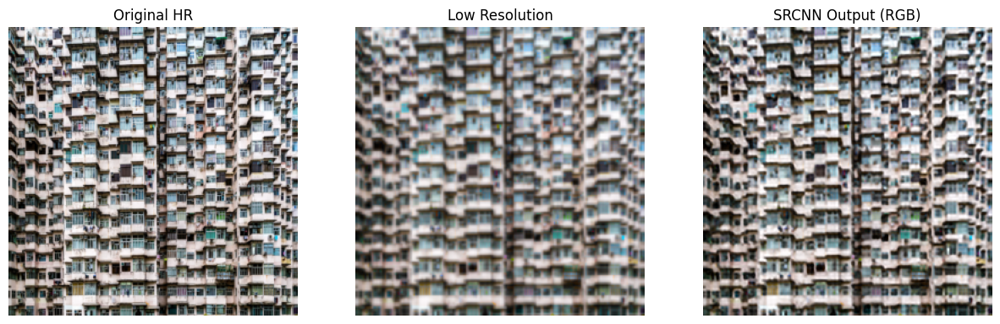

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, transform
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import tensorflow as tf
from tensorflow.keras import layers, models
from glob import glob

# تعریف آماده‌سازی تصویر Low-Resolution
def prepare_lr(img, scale=2):
    img = color.rgb2ycbcr(img)[:, :, 0]
    img = transform.resize(img, (img.shape[0]//scale, img.shape[1]//scale), anti_aliasing=True)
    img = transform.resize(img, (img.shape[0]*scale, img.shape[1]*scale), anti_aliasing=True)
    return img

# بارگذاری همه تصاویر
def load_images(path):
    files = glob(os.path.join(path, '*.bmp')) + glob(os.path.join(path, '*.png')) + glob(os.path.join(path, '*.jpg'))
    images = []
    for file in files:
        img = io.imread(file)
        img = transform.resize(img, (256, 256), anti_aliasing=True)
        images.append(img)
    return images

dataset_path = '/content/drive/MyDrive/basicCNN/DIV2K_train_HR/'  # مسیر دیتاست
images = load_images(dataset_path)

# آماده‌سازی داده‌ها
x_train = []
y_train = []

for img in images:
    lr = prepare_lr(img)
    hr = color.rgb2ycbcr(img)[:, :, 0]
    x_train.append(lr)
    y_train.append(hr)

x_train = np.expand_dims(np.array(x_train), -1)
y_train = np.expand_dims(np.array(y_train), -1)

# ساخت مدل SRCNN
model = models.Sequential([
    layers.Conv2D(64, (9,9), activation='relu', padding='same', input_shape=(None, None, 1)),
    layers.Conv2D(32, (5,5), activation='relu', padding='same'),
    layers.Conv2D(1, (5,5), activation='linear', padding='same')
])

model.compile(optimizer='adam', loss='mse')

# آموزش مدل
model.fit(x_train, y_train, batch_size=4, epochs=100, verbose=2)

# تست روی یک تصویر
idx = np.random.randint(0, len(images))
original_img = transform.resize(images[idx], (256, 256), anti_aliasing=True)
img_ycbcr = color.rgb2ycbcr(original_img)
lr_img = prepare_lr(original_img)

# مدل روی Y کانال کار می‌کند
test_lr = np.expand_dims(lr_img, axis=(0, -1))
predicted_y = model.predict(test_lr)[0, ..., 0]

# بازیابی کانال‌های Cb و Cr و بازسازی تصویر رنگی
cb = transform.resize(img_ycbcr[:, :, 1], predicted_y.shape, anti_aliasing=True)
cr = transform.resize(img_ycbcr[:, :, 2], predicted_y.shape, anti_aliasing=True)
output_ycbcr = np.stack((predicted_y, cb, cr), axis=-1)
output_rgb = np.clip(color.ycbcr2rgb(output_ycbcr), 0, 1)

# محاسبه ارزیابی روی کانال Y
test_hr = img_ycbcr[:, :, 0]
print("PSNR (Y channel):", psnr(test_hr, predicted_y, data_range=1.0))
print("SSIM (Y channel):", ssim(test_hr, predicted_y, data_range=1.0))

# نمایش نتایج
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.title('Original HR')
plt.imshow(original_img)
plt.axis('off')

plt.subplot(1,3,2)
plt.title('Low Resolution')
lr_show = color.ycbcr2rgb(np.stack((lr_img, cb, cr), axis=-1))
plt.imshow(np.clip(lr_show, 0, 1))
plt.axis('off')

plt.subplot(1,3,3)
plt.title('SRCNN Output (RGB)')
plt.imshow(output_rgb)
plt.axis('off')

plt.show()

cell code: 30

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
200/200 - 8s - 41ms/step - loss: 296.7970
Epoch 2/200
200/200 - 7s - 34ms/step - loss: 91.4764
Epoch 3/200
200/200 - 10s - 52ms/step - loss: 73.7895
Epoch 4/200
200/200 - 10s - 51ms/step - loss: 65.8816
Epoch 5/200
200/200 - 10s - 51ms/step - loss: 62.9714
Epoch 6/200
200/200 - 10s - 51ms/step - loss: 63.8611
Epoch 7/200
200/200 - 7s - 33ms/step - loss: 62.6592
Epoch 8/200
200/200 - 10s - 51ms/step - loss: 58.4367
Epoch 9/200
200/200 - 10s - 51ms/step - loss: 59.0599
Epoch 10/200
200/200 - 7s - 33ms/step - loss: 71.7013
Epoch 11/200
200/200 - 7s - 33ms/step - loss: 56.3702
Epoch 12/200
200/200 - 10s - 52ms/step - loss: 68.9909
Epoch 13/200
200/200 - 7s - 33ms/step - loss: 56.1907
Epoch 14/200
200/200 - 10s - 52ms/step - loss: 56.1402
Epoch 15/200
200/200 - 10s - 51ms/step - loss: 56.2647
Epoch 16/200
200/200 - 7s - 33ms/step - loss: 56.7697
Epoch 17/200
200/200 - 7s - 33ms/step - loss: 56.6996
Epoch 18/200
200/200 - 10s - 51ms/step - loss: 57.6298
Epoch 19/200
200/200 - 10s

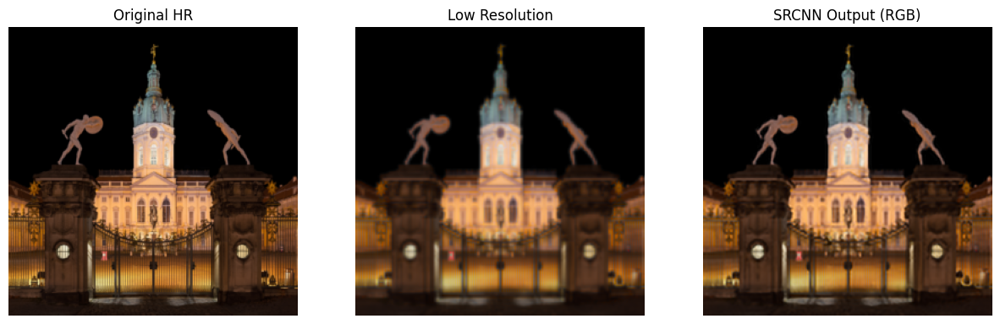

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, transform
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import tensorflow as tf
from tensorflow.keras import layers, models
from glob import glob

# تعریف آماده‌سازی تصویر Low-Resolution
def prepare_lr(img, scale=2):
    img = color.rgb2ycbcr(img)[:, :, 0]
    img = transform.resize(img, (img.shape[0]//scale, img.shape[1]//scale), anti_aliasing=True)
    img = transform.resize(img, (img.shape[0]*scale, img.shape[1]*scale), anti_aliasing=True)
    return img

# بارگذاری همه تصاویر
def load_images(path):
    files = glob(os.path.join(path, '*.bmp')) + glob(os.path.join(path, '*.png')) + glob(os.path.join(path, '*.jpg'))
    images = []
    for file in files:
        img = io.imread(file)
        img = transform.resize(img, (256, 256), anti_aliasing=True)
        images.append(img)
    return images

dataset_path = '/content/drive/MyDrive/basicCNN/DIV2K_train_HR/'  # مسیر دیتاست
images = load_images(dataset_path)

# آماده‌سازی داده‌ها
x_train = []
y_train = []

for img in images:
    lr = prepare_lr(img)
    hr = color.rgb2ycbcr(img)[:, :, 0]
    x_train.append(lr)
    y_train.append(hr)

x_train = np.expand_dims(np.array(x_train), -1)
y_train = np.expand_dims(np.array(y_train), -1)

# ساخت مدل SRCNN
model = models.Sequential([
    layers.Conv2D(64, (9,9), activation='relu', padding='same', input_shape=(None, None, 1)),
    layers.Conv2D(32, (5,5), activation='relu', padding='same'),
    layers.Conv2D(1, (5,5), activation='linear', padding='same')
])

model.compile(optimizer='adam', loss='mse')

# آموزش مدل
model.fit(x_train, y_train, batch_size=4, epochs=200, verbose=2)

# تست روی یک تصویر
idx = np.random.randint(0, len(images))
original_img = transform.resize(images[idx], (256, 256), anti_aliasing=True)
img_ycbcr = color.rgb2ycbcr(original_img)
lr_img = prepare_lr(original_img)

# مدل روی Y کانال کار می‌کند
test_lr = np.expand_dims(lr_img, axis=(0, -1))
predicted_y = model.predict(test_lr)[0, ..., 0]

# بازیابی کانال‌های Cb و Cr و بازسازی تصویر رنگی
cb = transform.resize(img_ycbcr[:, :, 1], predicted_y.shape, anti_aliasing=True)
cr = transform.resize(img_ycbcr[:, :, 2], predicted_y.shape, anti_aliasing=True)
output_ycbcr = np.stack((predicted_y, cb, cr), axis=-1)
output_rgb = np.clip(color.ycbcr2rgb(output_ycbcr), 0, 1)

# محاسبه ارزیابی روی کانال Y
test_hr = img_ycbcr[:, :, 0]
print("PSNR (Y channel):", psnr(test_hr, predicted_y, data_range=1.0))
print("SSIM (Y channel):", ssim(test_hr, predicted_y, data_range=1.0))

# نمایش نتایج
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.title('Original HR')
plt.imshow(original_img)
plt.axis('off')

plt.subplot(1,3,2)
plt.title('Low Resolution')
lr_show = color.ycbcr2rgb(np.stack((lr_img, cb, cr), axis=-1))
plt.imshow(np.clip(lr_show, 0, 1))
plt.axis('off')

plt.subplot(1,3,3)
plt.title('SRCNN Output (RGB)')
plt.imshow(output_rgb)
plt.axis('off')

plt.show()